# Background

The 2019 Novel Coronavirus, or 2019-nCoV, is a new respiratory virus first identified in Wuhan, Hubei Province, China. A novel coronavirus (nCoV) is a new coronavirus that has not been previously identified. The 2019 novel coronavirus (2019-nCoV), is not that same as the coronaviruses that commonly circulate among humans and cause mild illness, like the common cold.

A diagnosis with coronavirus 229E, NL63, OC43, or HKU1 is not the same as a 2019-nCoV diagnosis. These are different viruses and patients with 2019-nCoV will be evaluated and cared for differently than patients with common coronavirus diagnosis.

Public health officials and partners are working hard to identify the source of the 2019-nCoV. Coronaviruses are a large family of viruses, some causing illness in people and others that circulate among animals, including camels, cats and bats. Analysis of the genetic tree of this virus is ongoing to know the specific source of the virus. SARS, another coronavirus that emerged to infect people, came from civet cats, while MERS, another coronavirus that emerged to infect people, came from camels. More information about the source and spread of 2019-nCoV is available on the 2019-nCoV Situation Summary: Source and Spread of the Virus.

This virus probably originally emerged from an animal source but now seems to be spreading from person-to-person. It’s important to note that person-to-person spread can happen on a continuum. Some viruses are highly contagious (like measles), while other viruses are less so. At this time, it’s unclear how easily or sustainably this virus is spreading between people. Learn what is known about the spread of newly emerged coronaviruses.

## Aim
The purpose of this notebook is to firstly uncover and provide insights into the spread of Covid-19, particularly on the 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_open_line_list.csv
/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_line_list_data.csv
/kaggle/input/covid19-global-forecasting-locations-population/locations_population.csv
/kaggle/input/covid19-containment-and-mitigation-measures/COVID 19 Containment measures data.csv
/kaggle/input/population-pyramid-2019/United States of America-2019.csv
/kaggle/input/population-pyramid-2019/India-2019.csv
/kaggle/input/population-pyramid-2019/China-2019.csv
/kaggle/input/populatio

In [2]:
import os
import pandas as pd
import numpy as np
import warnings
import pprint
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib
from matplotlib.ticker import ScalarFormatter
%matplotlib inline
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as py
py.init_notebook_mode()
import pycountry
import plotly.express as px
import plotly.figure_factory as ff
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot
import folium
from datetime import datetime
from collections import defaultdict
from datetime import timedelta
import optuna
optuna.logging.disable_default_handler()
from scipy.integrate import solve_ivp
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans


time_format = "%d%b%Y %H:%M"
datetime.now().strftime(time_format)


# color pallette
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow


# Data Import, Preprocessing and EDA

In [3]:
ncov_df = pd.read_csv('../input/novel-corona-virus-2019-dataset/covid_19_data.csv',parse_dates=['Last Update'])
df_confirmed = pd.read_csv("/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv")
df_recovered = pd.read_csv("/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv")
df_deaths = pd.read_csv("/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv")
population_raw = pd.read_csv('../input/covid19-global-forecasting-locations-population/locations_population.csv')

ncov_df.rename(columns = {'ObservationDate':'Date', 'Country/Region':'Country'}, inplace = True)
df_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
df_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
df_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)

## Population dataset

In [4]:
population_raw.head()

,Province.State,Country.Region,Population,Provenance
0,NaN,Afghanistan,35530000,NaN
1,NaN,Albania,2877000,NaN
2,NaN,Algeria,41320000,NaN
3,NaN,Andorra,78000,NaN
4,NaN,Antigua and Barbuda,102012,NaN


In [5]:
pd.DataFrame(population_raw.isnull().sum()).T

,Province.State,Country.Region,Population,Provenance
0,196,0,0,314


In [6]:
df = population_raw.copy()
df = df.rename({"Province.State": "Province", "Country.Region": "Country"}, axis=1)
cols = ["Country", "Province", "Population"]
df = df.loc[:, cols].fillna("-")
df.loc[df["Country"] == df["Province"], "Province"] = "-"
df["Country"] = df["Country"].replace({"United Kingdom": "UK"})
# Add total records
_total_df = df.loc[df["Province"] != "-", :].groupby("Country").sum()
_total_df = _total_df.reset_index().assign(Province="-")
df = pd.concat([df, _total_df], axis=0, sort=True)
df = df.drop_duplicates(subset=["Country", "Province"], keep="first")
# Global
global_value = df.loc[df["Province"] == "-", "Population"].sum()
df = df.append(pd.Series(["Global", "-", global_value], index=cols), ignore_index=True)
# Sorting
df = df.sort_values("Population", ascending=False).reset_index(drop=True)
df = df.loc[:, cols]
pop_df = df.copy()
pop_df.head()

,Country,Province,Population
0,Global,-,7454412229
1,China,-,1376807262
2,India,-,1339000000
3,US,-,327200000
4,Indonesia,-,264000000


In [7]:
df = pop_df.loc[pop_df["Province"] == "-", :]
pop_dict = df.set_index("Country").to_dict()["Population"]
pop_dict

{'Global': 7454412229,
 'China': 1376807262,
 'India': 1339000000,
 'US': 327200000,
 'Indonesia': 264000000,
 'Brazil': 209300000,
 'Pakistan': 197000000,
 'Nigeria': 190900000,
 'Bangladesh': 164700000,
 'Russia': 144500000,
 'Mexico': 129200000,
 'Japan': 126800000,
 'Ethiopia': 105000000,
 'Philippines': 104900000,
 'Egypt': 97550000,
 'Vietnam': 95540000,
 'Germany': 82790000,
 'Republic of the Congo': 81340000,
 'Iran': 81160000,
 'Turkey': 80810000,
 'Thailand': 69040000,
 'UK': 66440000,
 'France': 64266012,
 'Italy': 60480000,
 'Tanzania': 57310000,
 'South Africa': 56720000,
 'Burma': 54319034,
 'Korea, South': 51470000,
 'Kenya': 49700000,
 'Colombia': 49070000,
 'Spain': 46660000,
 'Argentina': 44270000,
 'Uganda': 42860000,
 'Ukraine': 42220000,
 'Algeria': 41320000,
 'Sudan': 40530000,
 'Iraq': 38270000,
 'Poland': 37980000,
 'Canada': 37855939,
 'Morocco': 35740000,
 'Afghanistan': 35530000,
 'Saudi Arabia': 32940000,
 'Uzbekistan': 32390000,
 'Peru': 32170000,
 'Venezue

## Population Pyramid

In [8]:
for dirname, _, filenames in os.walk("/kaggle/input"):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_open_line_list.csv
/kaggle/input/novel-corona-virus-2019-dataset/covid_19_data.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_confirmed_US.csv
/kaggle/input/novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv
/kaggle/input/novel-corona-virus-2019-dataset/COVID19_line_list_data.csv
/kaggle/input/covid19-global-forecasting-locations-population/locations_population.csv
/kaggle/input/covid19-containment-and-mitigation-measures/COVID 19 Containment measures data.csv
/kaggle/input/population-pyramid-2019/United States of America-2019.csv
/kaggle/input/population-pyramid-2019/India-2019.csv
/kaggle/input/population-pyramid-2019/China-2019.csv
/kaggle/input/populatio

In [9]:
pyramid_csv_list = list()
for dirname, _, filenames in os.walk("/kaggle/input/population-pyramid-2019/"):
    for filename in filenames:
        name = os.path.join(dirname, filename)
        df = pd.read_csv(name)
        df["Country"], df["Year"], _ = filename.replace(".", "-").split("-")
        pyramid_csv_list.append(df)
pyramid_raw = pd.concat(pyramid_csv_list, sort=True)
pyramid_raw.head()

,Age,Country,F,M,Year
0,0-4,United States of America,9584856,10019240,2019
1,5-9,United States of America,9916621,10371128,2019
2,10-14,United States of America,10341652,10805817,2019
3,15-19,United States of America,10413408,10837194,2019
4,20-24,United States of America,11012420,11423547,2019


In [10]:
pyramid_raw["Country"].unique()

array(['United States of America', 'India', 'China', 'Spain', 'Germany',
       'France', 'Canada', 'United Kingdom', 'Iran', 'Japan', 'Italy'],
      dtype=object)

In [11]:
df = pyramid_raw.copy()
df["Country"] = df["Country"].replace(
    {
        "United States of America": "US",
        "United Kingdom": "UK",
    }
)
# Global (WORLD)
_male = [
    349432556, 342927576, 331497486, 316642222, 308286775, 306059387, 309236984,
    276447037, 249389688, 241232876, 222609691, 192215395, 157180267, 128939392,
    87185982, 54754941, 33648953, 15756942, 5327866, 1077791, 124144
]
_female = [
    328509234, 321511867, 309769906, 295553758, 289100903, 288632766, 296293748,
    268371754, 244399176, 238133281, 223162982, 195633743, 164961323, 140704320,
    101491347, 69026831, 48281201, 26429329, 11352182, 3055845, 449279
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Global",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Sweden
_male = [
    307116,
    304759,
    296771,
    270840,
    291723,
    376952,
    343311,
    315086,
    312017,
    336452,
    342117,
    306949,
    279609,
    265511,
    273061,
    195029,
    113166,
    61775,
    26170,
    6768,
    415
]
_female = [
    290553,
    288817,
    280944,
    257677,
    274760,
    361526,
    330153,
    300752,
    301288,
    327453,
    331458,
    300084,
    280009,
    272149,
    286879,
    212480,
    143654,
    97633,
    52624,
    18130,
    1771
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Sweden",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Philippines
_male = [
    5534962,
    5820604,
    5538414,
    5383822,
    5149849,
    4710777,
    4061897,
    3581091,
    3237426,
    2832825,
    2482953,
    2015857,
    1556935,
    1082875,
    668107,
    364200,
    199400,
    73508,
    17327,
    3035,
    208
]
_female = [
    5240508,
    5541514,
    5273495,
    5029137,
    4896316,
    4589506,
    3982681,
    3544279,
    3191565,
    2825286,
    2521463,
    2112380,
    1714689,
    1285782,
    895866,
    567282,
    360751,
    155294,
    57969,
    13376,
    1411
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Philippines",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Arrange
df["Population"] = df["F"] + df["M"]
df = df.pivot_table(
    index="Age", columns=["Country"], values="Population", aggfunc="last"
)
df = df.astype(np.int64).reset_index().rename({"Age": "Age_bin"}, axis=1)
series = df["Age_bin"].str.replace("+", "-122")
df[["Age_first", "Age_last"]] = series.str.split("-", expand=True).astype(np.int64)
df = df.drop("Age_bin", axis=1)
series = df["Age_last"]
df = df.apply(lambda x: x[:-2] / (x[-1] - x[-2] + 1), axis=1)
df["Age"] = series
df = pd.merge(df, pd.DataFrame({"Age": np.arange(0, 123, 1)}), on="Age", how="right", sort=True)
df = df.fillna(method="bfill").astype(np.int64)
df = df.set_index("Age")
pyramid_df = df.copy()
pyramid_df

,Canada,China,France,Germany,Global,India,Iran,Italy,Japan,Philippines,Spain,Sweden,UK,US
Age,,,,,,,,,,,,,,
0,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
1,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
2,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
3,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
4,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910
119,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910
120,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910


In [12]:
_period_of_life_list = [
    "school", "school", "school", "school",
    "school", "school/work", "work", "work", "work", "work",
    "retired", "retired", "retired"
]
df = pd.DataFrame(
    {
        "Age_first": [0, 3, 6, 11, 14, 19, 26, 36, 46, 56, 66, 76, 86],
        "Age_last": [2, 5, 10, 13, 18, 25, 35, 45, 55, 65, 75, 85, 95],
        "Period_of_life": _period_of_life_list,
        "Days": [3, 5, 6, 6, 7, 7, 6, 5, 5, 5, 4, 3, 2]
    }
)
# Adjustment by author
df["Types"] = df["Period_of_life"]
df["School"] = df[["Types", "Days"]].apply(lambda x: x[1] if "school" in x[0] else 0, axis=1)
df["Office"] = df[["Types", "Days"]].apply(lambda x: x[1] if "work" in x[0] else 0, axis=1)
df["Others"] = df["Days"] - df[["School", "Office"]].sum(axis=1)
df.loc[df["Others"] < 0, "Others"] = 0
df.loc[df.index[1:5], "School"] -= 1
df.loc[df.index[1:5], "Others"] += 1
df.loc[df.index[5], ["School", "Office", "Others"]] = [3, 3, 1]
df[["School", "Office", "Others"]] = df[["Days", "School", "Office", "Others"]].apply(
    lambda x: x[1:] / sum(x[1:]) * x[0], axis=1
).astype(np.int64)
df.loc[df.index[6:10], "Others"] += 1
df = df.drop(["Days", "Types"], axis=1)
# Show dataset
_out_df = df.copy()
_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others
0,0,2,school,3,0,0
1,3,5,school,4,0,1
2,6,10,school,5,0,1
3,11,13,school,5,0,1
4,14,18,school,6,0,1
5,19,25,school/work,3,3,1
6,26,35,work,0,6,1
7,36,45,work,0,5,1
8,46,55,work,0,5,1
9,56,65,work,0,5,1


In [13]:
df = pyramid_df.cumsum()
countries = df.columns[:]
df = pd.merge(_out_df, df, left_on="Age_last", right_on="Age", how="left")
_first = df.loc[df.index[0], countries]
df[countries] = df[countries].diff()
df.loc[df.index[0], countries] = _first
df[countries] = df[countries].apply(lambda x: x / x.sum(), axis=0)
out_df = df.copy()
out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Canada,China,France,Germany,Global,India,Iran,Italy,Japan,Philippines,Spain,Sweden,UK,US
0,0,2,school,3,0,0,0.031811,0.035600,0.033901,0.028711,0.052210,0.051289,0.054879,0.023674,0.023292,0.059807,0.025943,0.035809,0.035174,0.035813
1,3,5,school,4,0,1,0.031813,0.035809,0.034727,0.028115,0.051864,0.051752,0.052977,0.024795,0.024166,0.060893,0.027265,0.035727,0.035658,0.036229
2,6,10,school,5,0,1,0.052963,0.059984,0.060787,0.045016,0.084689,0.088830,0.080195,0.045552,0.043395,0.104088,0.050480,0.058956,0.060363,0.062293
3,11,13,school,5,0,1,0.031621,0.035035,0.036844,0.027347,0.049386,0.055770,0.043894,0.028506,0.026526,0.060010,0.031812,0.034614,0.034583,0.038632
4,14,18,school,6,0,1,0.053517,0.057906,0.059948,0.048961,0.079324,0.092191,0.067379,0.047546,0.045251,0.097064,0.048522,0.053759,0.055262,0.064638
5,19,25,school/work,3,3,1,0.089688,0.087912,0.080317,0.076269,0.107659,0.124634,0.099528,0.068986,0.066696,0.129404,0.068295,0.081871,0.085452,0.095708
6,26,35,work,0,6,1,0.141335,0.160417,0.119402,0.124868,0.152774,0.164456,0.192333,0.110560,0.106875,0.156425,0.113973,0.138543,0.136443,0.139912
7,36,45,work,0,5,1,0.133597,0.140662,0.124751,0.123987,0.131630,0.135250,0.163720,0.137011,0.134815,0.122671,0.162583,0.123699,0.129938,0.125441
8,46,55,work,0,5,1,0.132237,0.166102,0.134609,0.150438,0.116396,0.103354,0.110998,0.161104,0.142129,0.095804,0.158071,0.132422,0.134289,0.125788
9,56,65,work,0,5,1,0.137679,0.116123,0.124850,0.143657,0.088096,0.074217,0.075731,0.135972,0.123395,0.065197,0.128555,0.115113,0.119465,0.125640


In [14]:
def go_out(country, out_df=out_df):
    """
    Return the estimated number of days people usually go out.
    @country <str>: coutry name
    @out_df <pd.DataFrame>: template dataframe
    """
    df = out_df.copy()
    try:
        series = df[country]
    except KeyError:
        raise KeyError(f"Population pyramid data of {country} is not defined!")
    df = df.iloc[:, :6]
    df["Portion"] = series
    return df

In [15]:
go_out("Global")

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,3,0,0,0.052210
1,3,5,school,4,0,1,0.051864
2,6,10,school,5,0,1,0.084689
3,11,13,school,5,0,1,0.049386
4,14,18,school,6,0,1,0.079324
5,19,25,school/work,3,3,1,0.107659
6,26,35,work,0,6,1,0.152774
7,36,45,work,0,5,1,0.131630
8,46,55,work,0,5,1,0.116396
9,56,65,work,0,5,1,0.088096


In [16]:
df_confirmed.head()

,Province/State,Country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,12968,13273,13571,13907,14272,14657,15070,15500,15941,16404
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,855
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,259,267,276,284,291,315,328,346,346,346


## NCov Dataset

In [17]:
ncov_df.head()

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0


In [18]:
data_cols = ["Active", "Deaths", "Recovered"]
data_cols_all = ["Confirmed", "Active", "Deaths", "Recovered"]
rate_cols = ["Fatal per Confirmed", "Recovered per Confirmed", "Fatal per (Fatal or Recovered)"]
variable_dict = {"Susceptible": "S", "Infected": "I", "Recovered": "R", "Deaths": "D"}

In [19]:
df = ncov_df.copy()
df["Date"] = pd.to_datetime(df["Date"])
df["Country"] = df["Country"].replace(
    {
        "Mainland China": "China",
        "Hong Kong SAR": "Hong Kong",
        "Taipei and environs": "Taiwan",
        "Iran (Islamic Republic of)": "Iran",
        "Republic of Korea": "South Korea",
        "Republic of Ireland": "Ireland",
        "Macao SAR": "Macau",
        "Russian Federation": "Russia",
        "Republic of Moldova": "Moldova",
        "Taiwan*": "Taiwan",
        "Cruise Ship": "Others",
        "United Kingdom": "UK",
        "Viet Nam": "Vietnam",
        "Czechia": "Czech Republic",
        "St. Martin": "Saint Martin",
        "Cote d'Ivoire": "Ivory Coast",
        "('St. Martin',)": "Saint Martin",
        "Congo (Kinshasa)": "Congo",
    }
)
df["Province/State"] = df["Province/State"].fillna("-").replace(
    {
        "Cruise Ship": "Diamond Princess",
        "Diamond Princess cruise ship": "Diamond Princess"
    }
)
df['Active'] = df['Confirmed'] - df['Deaths'] - df['Recovered']

df.loc[df["Country"] == "Diamond Princess", ["Country", "Province/State"]] = ["Others", "Diamond Princess"]

df[data_cols_all] = df[data_cols_all].astype(np.int64)
ncov_df_ungrouped = df.loc[:, ["Date", "Country", "Province/State", *data_cols_all]]
ncov_df_ungrouped.tail()

,Date,Country,Province/State,Confirmed,Active,Deaths,Recovered
58296,2020-07-06,Mexico,Zacatecas,1140,264,112,764
58297,2020-07-06,Ukraine,Zakarpattia Oblast,3375,2263,111,1001
58298,2020-07-06,Ukraine,Zaporizhia Oblast,597,136,17,444
58299,2020-07-06,China,Zhejiang,1269,1,1,1267
58300,2020-07-06,Ukraine,Zhytomyr Oblast,1468,488,30,950


In [20]:
pd.DataFrame(ncov_df_ungrouped.isnull().sum()).T

,Date,Country,Province/State,Confirmed,Active,Deaths,Recovered
0,0,0,0,0,0,0,0


In [21]:
ncov_df = ncov_df_ungrouped.groupby(["Date", "Country", "Province/State"])[['Date', 'Province/State', 'Country', 'Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

In [22]:
ncov_df

,Date,Country,Province/State,Confirmed,Deaths,Recovered
0,2020-01-22,China,Anhui,1,0,0
1,2020-01-22,China,Beijing,14,0,0
2,2020-01-22,China,Chongqing,6,0,0
3,2020-01-22,China,Fujian,1,0,0
4,2020-01-22,China,Gansu,0,0,0
...,...,...,...,...,...,...
58291,2020-07-06,West Bank and Gaza,-,4341,17,491
58292,2020-07-06,Western Sahara,-,10,1,8
58293,2020-07-06,Yemen,-,1284,345,575
58294,2020-07-06,Zambia,-,1632,30,1348


In [23]:
ncov_df.groupby(['Country'])[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Country,Confirmed,Deaths,Recovered
0,Azerbaijan,1,0,0
1,Afghanistan,1199996,25778,319506
2,Albania,114287,3450,72308
3,Algeria,715382,55664,433640
4,Andorra,76032,4331,52216
...,...,...,...,...
215,Western Sahara,691,42,480
216,Yemen,34858,8722,9029
217,Zambia,70400,802,50048
218,Zimbabwe,18633,407,3699


In [24]:
temp = ncov_df_ungrouped.groupby(['Date'])['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case',
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.show()

In [25]:
df_confirmed

,Province/State,Country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,...,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,12968,13273,13571,13907,14272,14657,15070,15500,15941,16404
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,855
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,259,267,276,284,291,315,328,346,346,346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,...,713,713,713,714,715,717,719,719,720,721
262,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,1103,1118,1128,1158,1190,1221,1240,1248,1265,1284
263,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,...,272,272,272,303,303,303,309,309,311,311
264,NaN,Tajikistan,38.861034,71.276093,0,0,0,0,0,0,...,5799,5849,5900,5900,6005,6058,6058,6159,6213,6262


In [26]:
df_confirmed2 = df_confirmed[['Province/State', 'Lat', 'Long', 'Country']]
df_latlong = pd.merge(ncov_df_ungrouped, df_confirmed2, on=["Province/State" ,"Country"])

In [27]:
# Worldwide

m = folium.Map(location=[0, 0], tiles='cartodbpositron',
               min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(df_latlong)):
    folium.Circle(
        location=[df_latlong.iloc[i]['Lat'], df_latlong.iloc[i]['Long']],
        color='crimson', 
        tooltip =   '<li><bold>Country : '+str(df_latlong.iloc[i]['Country'])+
                    '<li><bold>Province : '+str(df_latlong.iloc[i]['Province/State'])+
                    '<li><bold>Confirmed : '+str(df_latlong.iloc[i]['Confirmed'])+
                    '<li><bold>Deaths : '+str(df_latlong.iloc[i]['Deaths'])+
                    '<li><bold>Recovered : '+str(df_latlong.iloc[i]['Recovered']),
        radius=int(df_latlong.iloc[i]['Confirmed'])**1.1).add_to(m)

In [28]:
df2 = ncov_df_ungrouped.groupby(['Date', 'Country'])['Confirmed', 'Deaths', 'Recovered'].max()
df2 = df2.reset_index()
df2['Date'] = pd.to_datetime(df2['Date'])
df2['Date'] = df2['Date'].dt.strftime('%m/%d/%Y')
df2['size'] = df2['Confirmed'].pow(0.3)

fig = px.scatter_geo(df2, locations="Country", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country", 
                     range_color= [0, 5000], 
                     projection="natural earth", animation_frame="Date", 
                     title='Covid-19 - Spread of Cases Over Time', color_continuous_scale="portland")
fig.update(layout_coloraxis_showscale=True)
fig.show()

In [29]:
df2 = ncov_df_ungrouped.groupby(['Date', 'Country'])['Active', 'Deaths', 'Recovered'].max()
df2 = df2.reset_index()
df2['Date'] = pd.to_datetime(df2['Date'])
df2['Date'] = df2['Date'].dt.strftime('%m/%d/%Y')
df2['size'] = df2['Active'].pow(0.3)

fig = px.scatter_geo(df2, locations="Country", locationmode='country names', 
                     color="Active", size='size', hover_name="Country", 
                     range_color= [0, 5000], 
                     projection="natural earth", animation_frame="Date", 
                     title='Covid-19 - Spread of Active Cases Over Time', color_continuous_scale="portland")
fig.update(layout_coloraxis_showscale=True)
fig.show()

# Measures in Each Country

# Prediction

## Preparing Data for Prediction

In [30]:
df_confirmed = ncov_df_ungrouped.groupby(['Date']).sum()['Confirmed'].reset_index()
df_confirmed['Growth'] = df_confirmed['Confirmed'].pct_change(periods=1)
df_confirmed

,Date,Confirmed,Growth
0,2020-01-22,555,NaN
1,2020-01-23,653,0.176577
2,2020-01-24,941,0.441041
3,2020-01-25,1438,0.528162
4,2020-01-26,2118,0.472879
...,...,...,...
162,2020-07-02,10869739,0.016571
163,2020-07-03,11074878,0.018872
164,2020-07-04,11267309,0.017375
165,2020-07-05,11449707,0.016188


In [31]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x = df_confirmed['Date'], y = df_confirmed['Confirmed'], name = "Confirmed"),
    secondary_y = False,
)

fig.add_trace(
    go.Scatter(x = df_confirmed['Date'], y = df_confirmed['Growth'], name = "Daily Growth Rate"),
    secondary_y = True,
)

fig.update_layout(
    title_text="Confirmed Cases and Growth Rate Over Time"
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Confirmed Cases", secondary_y = False)
fig.update_yaxes(title_text="Daily Growth Rate", secondary_y=True)

fig.show()


In [32]:
df_confirmed_1 = df_confirmed.drop('Confirmed', axis = 1)
df_confirmed_1.columns = ['ds','y']
df_confirmed_1['ds'] = pd.to_datetime(df_confirmed_1['ds'])
df_confirmed_1

,ds,y
0,2020-01-22,NaN
1,2020-01-23,0.176577
2,2020-01-24,0.441041
3,2020-01-25,0.528162
4,2020-01-26,0.472879
...,...,...
162,2020-07-02,0.016571
163,2020-07-03,0.018872
164,2020-07-04,0.017375
165,2020-07-05,0.016188


## Forecasting Total Confirmed Cases Worldwide

### Prophet
We use Prophet, a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. It is also an open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

#### Why Prophet?
Prophet is easy to customize and use, and to produce accurate forecasts which can be explained intuitively with supporting evidence such as forecast seasonality components. It allows the analyst to explain in an intuitive and convinving manner to higher management as to why the forecasts are as such, and the plausible underlying factors that contribute to its result. 

#### References
- https://facebook.github.io/prophet/
- https://facebook.github.io/prophet/docs/
- https://github.com/facebook/prophet

In [33]:
m = Prophet(interval_width=0.95)
m.fit(df_confirmed_1)
future = m.make_future_dataframe(periods=30)
future_confirmed = future.copy() # for non-baseline predictions later on
future.tail()

,ds
192,2020-08-01
193,2020-08-02
194,2020-08-03
195,2020-08-04
196,2020-08-05


In [34]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
192,2020-08-01,-0.012263,-0.163974,0.134528
193,2020-08-02,-0.010252,-0.159289,0.139615
194,2020-08-03,-0.023143,-0.167790,0.126516
195,2020-08-04,0.000547,-0.145440,0.155978
196,2020-08-05,-0.035700,-0.178037,0.112747


In [35]:
fig = plot_plotly(m, forecast)
py.iplot(fig)

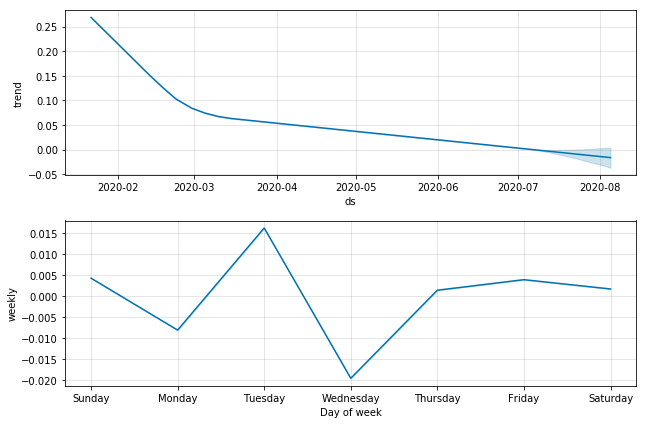

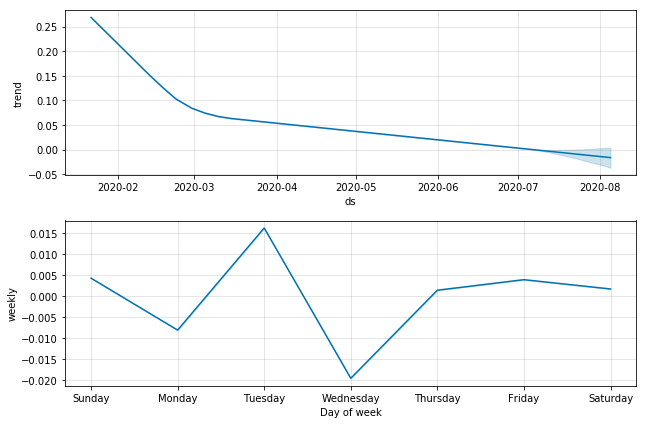

In [36]:
m.plot_components(forecast)

From this analysis, we can see that there is an overall downward trend in the growth of active cases, which is largely driven by fewer new cases and a greater number of people recovering in Asian countries including China, South Korea and Japan. Further evidence of this is shown in the graphs below:

In [37]:
df_China = ncov_df_ungrouped.groupby(['Date', 'Country'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
df_China = df_China[df_China['Country'] == 'China']
df_China.head()

,Date,Country,Confirmed,Deaths,Recovered,Active
0,2020-01-22,China,547,17,28,502
10,2020-01-23,China,639,18,30,591
24,2020-01-24,China,916,26,36,854
36,2020-01-25,China,1399,42,39,1318
51,2020-01-26,China,2062,56,49,1957


In [38]:
temp_China = df_China.groupby(['Date'])['Recovered', 'Deaths', 'Confirmed', 'Active'].sum().reset_index()
temp_China = temp_China.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Active', value_name='Count')
temp.head()

fig = px.area(temp_China, x="Date", y="Count", color='Active',
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.show()

In [39]:
UK_df = ncov_df_ungrouped.groupby(['Date', 'Country'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
UK_df = UK_df[UK_df['Country'] == 'UK']
UK_df.head()

,Date,Country,Confirmed,Deaths,Recovered,Active
164,2020-01-31,UK,2,0,0,2
191,2020-02-01,UK,2,0,0,2
218,2020-02-02,UK,2,0,0,2
245,2020-02-03,UK,2,0,0,2
273,2020-02-04,UK,2,0,0,2


In [40]:
temp_UK = UK_df.groupby(['Date'])['Recovered', 'Deaths', 'Confirmed', 'Active'].sum().reset_index()
temp_UK = temp_UK.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Active', value_name='Count')
temp.head()

fig = px.area(temp_UK, x="Date", y="Count", color='Active',
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.show()

In [41]:
critical_country_start = '31Jan2020'

## Organising Countries into Groups

In [42]:
df = ncov_df_ungrouped.pivot_table(
    index="Date", columns="Country", values="Confirmed", aggfunc="sum"
).fillna(method="ffill").fillna(0)
# Growth factor: (delta Number_n) / (delta Number_n)
df = df.diff() / df.diff().shift(freq="D")
df = df.replace(np.inf, np.nan).fillna(1.0)
# Rolling mean (window: 7 days)
df = df.rolling(7).mean()
df = df.iloc[6:-1, :]
# round: 0.01
growth_value_df = df.round(2)
growth_value_df.tail()

Country,Azerbaijan,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uzbekistan,Vatican City,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe,occupied Palestinian territory
Date,,,,,,,,,,,,,,,,,,,,,
2020-07-02,1.0,0.97,1.06,1.10,1.0,1.07,0.71,1.01,0.98,1.0,...,1.07,1.0,1.08,1.00,1.44,1.0,1.15,1.36,0.88,1.0
2020-07-03,1.0,1.13,1.07,1.08,1.0,1.15,NaN,1.00,1.00,1.0,...,1.04,1.0,1.10,1.00,1.09,1.0,1.21,0.89,0.91,1.0
2020-07-04,1.0,1.20,1.07,1.06,1.0,1.20,NaN,1.01,1.00,1.0,...,1.03,1.0,0.99,0.86,1.16,1.0,1.12,1.04,2.13,1.0
2020-07-05,1.0,1.02,1.06,1.06,1.0,1.18,NaN,1.02,1.02,1.0,...,1.02,1.0,1.20,1.00,1.19,1.0,1.27,1.04,2.16,1.0
2020-07-06,1.0,1.03,1.07,1.07,1.0,1.16,NaN,1.02,0.99,1.0,...,1.03,1.0,1.08,1.00,1.05,1.0,1.33,1.12,2.16,1.0


In [43]:
df = growth_value_df.copy()
df = df.iloc[-7:, :].T
day_cols = df.columns.strftime("%d%b%Y")
df.columns = day_cols
last_date = day_cols[-1]
# Grouping
more_col, less_col = "GF > 1 [straight days]", "GF < 1 [straight days]"
df[more_col] = (growth_value_df > 1).iloc[::-1].cumprod().sum(axis=0)
df[less_col] = (growth_value_df < 1).iloc[::-1].cumprod().sum(axis=0)
df["Group"] = df[[more_col, less_col]].apply(
    lambda x: "Outbreaking" if x[0] >= 7 else "Stopping" if x[1] >= 7 else "Crossroad",
    axis=1
)
# Sorting
df = df.loc[:, ["Group", more_col, less_col, *day_cols]]
df["rank1"] = df[more_col] * df[last_date]
df["rank2"] = df[less_col] * df[last_date]
df = df.sort_values(["Group", "rank1", "rank2"], ascending=False)
df = df.drop(["rank1", "rank2"], axis=1)
growth_df = df.copy()
growth_df.head()

,Group,GF > 1 [straight days],GF < 1 [straight days],30Jun2020,01Jul2020,02Jul2020,03Jul2020,04Jul2020,05Jul2020,06Jul2020
Country,,,,,,,,,,
Nicaragua,Stopping,0,109,0.86,0.86,0.86,0.86,0.86,0.86,0.86
Burundi,Stopping,0,37,0.86,0.86,0.86,0.86,0.71,0.86,0.86
Guinea-Bissau,Stopping,0,41,0.71,0.71,0.71,0.71,0.71,0.71,0.71
Botswana,Stopping,0,35,0.80,0.66,0.80,0.80,0.66,0.66,0.66
Kosovo,Stopping,0,38,0.91,0.85,0.80,0.66,0.66,0.66,0.59


In [44]:
df = pd.merge(ncov_df_ungrouped, growth_df["Group"].reset_index(), on="Country")
ncov_df = df.loc[:, ["Date", "Group", *ncov_df_ungrouped.columns[1:]]]
ncov_df.tail()

,Date,Group,Country,Province/State,Confirmed,Active,Deaths,Recovered
58296,2020-07-02,Stopping,Lesotho,-,35,24,0,11
58297,2020-07-03,Stopping,Lesotho,-,35,24,0,11
58298,2020-07-04,Stopping,Lesotho,-,35,24,0,11
58299,2020-07-05,Stopping,Lesotho,-,79,68,0,11
58300,2020-07-06,Stopping,Lesotho,-,91,80,0,11


In [45]:
critical_country = 'UK'

In [46]:
critical_df = ncov_df.loc[ncov_df["Country"] == critical_country, ["Date", *data_cols]].groupby("Date").sum()
critical_df.tail()

,Active,Deaths,Recovered
Date,,,
2020-07-02,239815,44080,1373
2020-07-03,240196,44216,1375
2020-07-04,240754,44283,1375
2020-07-05,241251,44305,1375
2020-07-06,241594,44321,1375


# Functions
### Plotting

In [47]:
def line_plot(df, title, ylabel="Cases", h=None, v=None,
              xlim=(None, None), ylim=(0, None), math_scale=True, y_logscale=False, y_integer=False):
    """
    Show chlonological change of the data.
    """
    ax = df.plot()
    if math_scale:
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style="sci",  axis="y",scilimits=(0, 0))
    if y_logscale:
        ax.set_yscale("log")
    if y_integer:
        fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
        fmt.set_scientific(False)
        ax.yaxis.set_major_formatter(fmt)
    ax.set_title(title)
    ax.set_xlabel(None)
    ax.set_ylabel(ylabel)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
    if h is not None:
        ax.axhline(y=h, color="black", linestyle="--")
    if v is not None:
        if not isinstance(v, list):
            v = [v]
        for value in v:
            ax.axvline(x=value, color="black", linestyle="--")
    plt.tight_layout()
    plt.show()

In [48]:
from pandas.plotting import register_matplotlib_converters       

register_matplotlib_converters()

### Trend Ananlysis

In [49]:
def select_area(ncov_df, group="Date", places=None, areas=None, excluded_places=None,
                start_date=None, end_date=None, date_format="%d%b%Y"):
    """
    Select the records of the palces.
    @ncov_df <pd.DataFrame>: the clean data
    @group <str or None>: group-by the group, or not perform (None)
    @area or @places:
        if ncov_df has Country and Province column,
            @places <list[tuple(<str/None>, <str/None>)]: the list of places
                - if the list is None, all data will be used
                - (str, str): both of country and province are specified
                - (str, None): only country is specified
                - (None, str) or (None, None): Error
        if ncov_df has Area column,
            @areas <list[str]>: the list of area names
                - if the list is None, all data will be used
                - eg. Japan
                - eg. US/California
    @excluded_places <list[tuple(<str/None>, <str/None>)]: the list of excluded places
        - if the list is None, all data in the "places" will be used
        - (str, str): both of country and province are specified
        - (str, None): only country is specified
        - (None, str) or (None, None): Error
    @start_date <str>: the start date or None
    @end_date <str>: the start date or None
    @date_format <str>: format of @start_date and @end_date
    @return <pd.DataFrame>: index and columns are as same as @ncov_df
    """
    # Select the target records
    df = ncov_df.copy()
    if (places is not None) or (excluded_places is not None):
        c_series = df["Country"]
        p_series = df["Province/State"]
        if places is not None:
            df = pd.DataFrame(columns=ncov_df.columns)
            for (c, p) in places:
                if c is None:
                    raise Exception("places: Country must be specified!")
                if p is None:
                    new_df = ncov_df.loc[c_series == c, :]
                else:
                    new_df = ncov_df.loc[(c_series == c) & (p_series == p), :]
                df = pd.concat([df, new_df], axis=0)
        if excluded_places is not None:
            for (c, p) in excluded_places:
                if c is None:
                    raise Exception("excluded_places: Country must be specified!")
                if p is None:
                    df = df.loc[c_series != c, :]
                else:
                    c_df = df.loc[(c_series == c) & (p_series != p), :]
                    other_df = df.loc[c_series != c, :]
                    df = pd.concat([c_df, other_df], axis=0)
    if areas is not None:
        df = df.loc[df["Area"].isin(areas), :]
    if group is not None:
        df = df.groupby(group).sum().reset_index()
    # Range of date
    if start_date is not None:
        df = df.loc[df["Date"] >= datetime.strptime(start_date, date_format), :]
    if end_date is not None:
        df = df.loc[df["Date"] <= datetime.strptime(end_date, date_format), :]
    # Only use the records with Confirmed > 0
    try:
        df = df.loc[df["Confirmed"] > 0, :]
    except KeyError:
        pass
    # Aleart empty
    if df.empty:
        raise Exception("The output dataframe is empty!")
    return df

In [50]:
def show_trend(ncov_df, name=None, variable="Confirmed", n_changepoints=2, **kwargs):
    """
    Show trend of log10(@variable) using fbprophet package.
    @ncov_df <pd.DataFrame>: the clean data
    @variable <str>: variable name to analyse
        - if Confirmed, use Infected + Recovered + Deaths
    @n_changepoints <int>: max number of change points
    @kwargs: keword arguments of select_area()
    """
    # Data arrangement
    df = select_area(ncov_df, **kwargs)
    df = df.loc[:, ["Date", variable]]
    df.columns = ["ds", "y"]
    # Log10(x)
    warnings.resetwarnings()
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        df["y"] = np.log10(df["y"]).replace([np.inf, -np.inf], 0)
    # fbprophet
    model = Prophet(growth="linear", daily_seasonality=False, n_changepoints=n_changepoints)
    model.fit(df)
    future = model.make_future_dataframe(periods=0)
    forecast = model.predict(future)
    # Create figure
    fig = model.plot(forecast)
    _ = add_changepoints_to_plot(fig.gca(), model, forecast)
    if name is None:
        try:
            name = f"{kwargs['places'][0][0]}: "
        except Exception:
            name = str()
    else:
        name = f"{name}: "
    plt.title(f"{name}log10({variable}) over time and change points")
    plt.ylabel(f"log10(the number of cases)")
    plt.xlabel("")

## Dataset Arrangement

In [51]:
def create_target_df(ncov_df, total_population,
                     confirmed="Confirmed", recovered="Recovered", fatal="Deaths", **kwargs):
    """
    Select the records of the places, calculate the number of susceptible people,
     and calculate the elapsed time [day] from the start date of the target dataframe.
    @ncov_df <pd.DataFrame>: the clean data
    @total_population <int>: total population in the places
    column names in @ncov_df:
        @confirmed <str>: column name of the number of confirmed cases
        @recovered <str>: column name of the number of recovered cases
        @fatal <str>: column name of the number of fatal cases
    @kwargs: keword arguments of select_area()
    @return <tuple(2 objects)>:
        - 1. first_date <pd.Timestamp>: the first date of the selected records
        - 2. target_df <pd.DataFrame>:
            - column T: elapsed time [min] from the start date of the dataset
            - column Susceptible: the number of patients who are in the palces but not infected/recovered/died
            - column Infected: the number of infected cases
            - column Recovered: the number of recovered cases
            - column Deaths: the number of death cases
    """
    # Select the target records
    df = select_area(ncov_df, **kwargs)
    first_date = df.loc[df.index[0], "Date"]
    # column T
    df["T"] = ((df["Date"] - first_date).dt.total_seconds() / 60).astype(int)
    # coluns except T
    cols = [confirmed, recovered, fatal]
    if not set(cols).issubset(set(df.columns)):
        raise KeyError(f"ncov_df must have {', '.join(cols)} column!")
    df["Susceptible"] = total_population - df[confirmed]
    df["Infected"] = df[confirmed] - df[recovered] - df[fatal]
    df["Recovered"] = df[recovered]
    df["Fatal"] = df.loc[:, fatal]
    response_variables = ["Susceptible", "Infected", "Recovered", "Fatal"]
    # Return
    target_df = df.loc[:, ["T", *response_variables]]
    return (first_date, target_df)

## Modelling

In [52]:
def simulation(model, initials, step_n, **params):
    """
    Solve ODE of the model.
    @model <ModelBase>: the model
    @initials <tuple[float]>: the initial values
    @step_n <int>: the number of steps
    @params: the paramerters of the model
    """
    tstart, dt, tend = 0, 1, step_n
    sol = solve_ivp(
        fun=model(**params),
        t_span=[tstart, tend],
        y0=np.array(initials, dtype=np.float64),
        t_eval=np.arange(tstart, tend + dt, dt),
        dense_output=False  # True
    )
    t_df = pd.Series(data=sol["t"], name="t")
    y_df = pd.DataFrame(data=sol["y"].T.copy(), columns=model.VARIABLES)
    sim_df = pd.concat([t_df, y_df], axis=1)
    return sim_df

In [53]:
class ModelBase(object):
    NAME = "Model"
    VARIABLES = ["x"]
    PRIORITIES = np.array([1])
    QUANTILE_RANGE = [0.3, 0.7]
    MONOTONIC = ["x"]

    @classmethod
    def param_dict(cls, train_df_divided=None, q_range=None):
        """
        Define parameters without tau. This function should be overwritten.
        @train_df_divided <pd.DataFrame>:
            - column: t and non-dimensional variables
        @q_range <list[float, float]>: quantile rage of the parameters calculated by the data
        @return <dict[name]=(min, max):
            @min <float>: min value
            @max <float>: max value
        """
        param_dict = dict()
        return param_dict

    @staticmethod
    def calc_variables(df):
        """
        Calculate the variables of the model.
        This function should be overwritten.
        @df <pd.DataFrame>
        @return <pd.DataFrame>
        """
        return df

    @staticmethod
    def calc_variables_reverse(df):
        """
        Calculate measurable variables using the variables of the model.
        This function should be overwritten.
        @df <pd.DataFrame>
        @return <pd.DataFrame>
        """
        return df

    @classmethod
    def create_dataset(cls, ncov_df, total_population, **kwargs):
        """
        Create dataset with the model-specific varibles.
        The variables will be divided by total population.
        The column names (not include T) will be lower letters.
        **kwargs: See the function named create_target_df()
        @return <tuple(objects)>:
            - start_date <pd.Timestamp>
            - initials <tuple(float)>: the initial values
            - Tend <int>: the last value of T
            - df <pd.DataFrame>: the dataset
        """
        start_date, target_df = create_target_df(ncov_df, total_population, **kwargs)
        df = cls.calc_variables(target_df).set_index("T") / total_population
        df.columns = [n.lower() for n in df.columns]
        initials = df.iloc[0, :].values
        df = df.reset_index()
        Tend = df.iloc[-1, 0]
        return (start_date, initials, Tend, df)

    def calc_r0(self):
        """
        Calculate R0. This function should be overwritten.
        """
        return None

    def calc_days_dict(self, tau):
        """
        Calculate 1/beta [day] etc.
        This function should be overwritten.
        @param tau <int>: tau value [hour]
        """
        return dict()

### SIR Model

In [54]:
class SIR(ModelBase):
    NAME = "SIR"
    VARIABLES = ["x", "y", "z"]
    PRIORITIES = np.array([1, 1, 1])
    MONOTONIC = ["z"]

    def __init__(self, rho, sigma):
        super().__init__()
        self.rho = rho
        self.sigma = sigma

    def __call__(self, t, X):
        # x, y, z = [X[i] for i in range(len(self.VARIABLES))]
        # dxdt = - self.rho * x * y
        # dydt = self.rho * x * y - self.sigma * y
        # dzdt = self.sigma * y
        dxdt = - self.rho * X[0] * X[1]
        dydt = self.rho * X[0] * X[1] - self.sigma * X[1]
        dzdt = self.sigma * X[1]
        return np.array([dxdt, dydt, dzdt])

    @classmethod
    def param_dict(cls, train_df_divided=None, q_range=None):
        param_dict = super().param_dict()
        q_range = super().QUANTILE_RANGE[:] if q_range is None else q_range
        if train_df_divided is not None:
            df = train_df_divided.copy()
            # rho = - (dx/dt) / x / y
            rho_series = 0 - df["x"].diff() / df["t"].diff() / df["x"] / df["y"]
            param_dict["rho"] = rho_series.quantile(q_range)
            # sigma = (dz/dt) / y
            sigma_series = df["z"].diff() / df["t"].diff() / df["y"]
            param_dict["sigma"] = sigma_series.quantile(q_range)
            return param_dict
        param_dict["rho"] = (0, 1)
        param_dict["sigma"] = (0, 1)
        return param_dict

    @staticmethod
    def calc_variables(df):
        df["X"] = df["Susceptible"]
        df["Y"] = df["Infected"]
        df["Z"] = df["Recovered"] + df["Fatal"]
        return df.loc[:, ["T", "X", "Y", "Z"]]

    @staticmethod
    def calc_variables_reverse(df):
        df["Susceptible"] = df["X"]
        df["Infected"] = df["Y"]
        df["Recovered/Deaths"] = df["Z"]
        return df

    def calc_r0(self):
        if self.sigma == 0:
            return np.nan
        r0 = self.rho / self.sigma
        return round(r0, 2)

    def calc_days_dict(self, tau):
        _dict = dict()
        _dict["1/beta [day]"] = int(tau / 24 / 60 / self.rho)
        _dict["1/gamma [day]"] = int(tau / 24 / 60 / self.sigma)
        return _dict

In [55]:
class SIRF(ModelBase):
    NAME = "SIR-F"
    VARIABLES = ["x", "y", "z", "w"]
    PRIORITIES = np.array([1, 10, 10, 2])
    MONOTONIC = ["z", "w"]

    def __init__(self, theta, kappa, rho, sigma):
        super().__init__()
        self.theta = theta
        self.kappa = kappa
        self.rho = rho
        self.sigma = sigma

    def __call__(self, t, X):
        # x, y, z, w = [X[i] for i in range(len(self.VARIABLES))]
        # dxdt = - self.rho * x * y
        # dydt = self.rho * (1 - self.theta) * x * y - (self.sigma + self.kappa) * y
        # dzdt = self.sigma * y
        # dwdt = self.rho * self.theta * x * y + self.kappa * y
        dxdt = - self.rho * X[0] * X[1]
        dydt = self.rho * (1 - self.theta) * X[0] * X[1] - (self.sigma + self.kappa) * X[1]
        dzdt = self.sigma * X[1]
        dwdt = self.rho * self.theta * X[0] * X[1] + self.kappa * X[1]
        return np.array([dxdt, dydt, dzdt, dwdt])

    @classmethod
    def param_dict(cls, train_df_divided=None, q_range=None):
        param_dict = super().param_dict()
        q_range = super().QUANTILE_RANGE[:] if q_range is None else q_range
        param_dict["theta"] = (0, 1)
        param_dict["kappa"] = (0, 1)
        if train_df_divided is not None:
            df = train_df_divided.copy()
            # rho = - (dx/dt) / x / y
            rho_series = 0 - df["x"].diff() / df["t"].diff() / df["x"] / df["y"]
            param_dict["rho"] = rho_series.quantile(q_range)
            # sigma = (dz/dt) / y
            sigma_series = df["z"].diff() / df["t"].diff() / df["y"]
            param_dict["sigma"] = sigma_series.quantile(q_range)
            return param_dict
        param_dict["rho"] = (0, 1)
        param_dict["sigma"] = (0, 1)
        return param_dict

    @staticmethod
    def calc_variables(df):
        df["X"] = df["Susceptible"]
        df["Y"] = df["Infected"]
        df["Z"] = df["Recovered"]
        df["W"] = df["Fatal"]
        return df.loc[:, ["T", "X", "Y", "Z", "W"]]

    @staticmethod
    def calc_variables_reverse(df):
        df["Susceptible"] = df["X"]
        df["Infected"] = df["Y"]
        df["Recovered"] = df["Z"]
        df["Fatal"] = df["W"]
        return df

    def calc_r0(self):
        try:
            r0 = self.rho * (1 - self.theta) / (self.sigma + self.kappa)
        except ZeroDivisionError:
            return np.nan
        return round(r0, 2)

    def calc_days_dict(self, tau):
        _dict = dict()
        _dict["alpha1 [-]"] = round(self.theta, 3)
        if self.kappa == 0:
            _dict["1/alpha2 [day]"] = 0
        else:
            _dict["1/alpha2 [day]"] = int(tau / 24 / 60 / self.kappa)
        _dict["1/beta [day]"] = int(tau / 24 / 60 / self.rho)
        if self.sigma == 0:
            _dict["1/gamma [day]"] = 0
        else:
            _dict["1/gamma [day]"] = int(tau / 24 / 60 / self.sigma)
        return _dict

### Hyperparameter Optimisation

In [56]:
class Estimator(object):
    def __init__(self, model, ncov_df, total_population, name=None, places=None, areas=None,
                 excluded_places=None, start_date=None, end_date=None, date_format="%d%b%Y", **params):
        """
        Set training data.
        @model <ModelBase>: the model
        @name <str>: name of the area
        @params: fixed parameter of the model
        @the other params: See the function named create_target_df()
        """
        # Fixed parameters
        self.fixed_param_dict = params.copy()
        if None in params.values():
            self.fixed_param_dict = {
                k: v for (k, v) in params.items() if v is not None
            }
        # Register the dataset arranged for the model
        dataset = model.create_dataset(
            ncov_df, total_population, places=places, areas=areas,
            excluded_places=excluded_places,
            start_date=start_date, end_date=end_date, date_format=date_format
        )
        self.start_time, self.initials, self.Tend, self.train_df = dataset
        self.total_population = total_population
        self.name = name
        self.model = model
        self.param_dict = dict()
        self.study = None
        self.optimize_df = None

    def run(self, n_trials=500):
        """
        Try estimation (optimization of parameters and tau).
        @n_trials <int>: the number of trials
        """
        if self.study is None:
            self.study = optuna.create_study(direction="minimize")
        self.study.optimize(
            lambda x: self.objective(x),
            n_trials=n_trials,
            n_jobs=-1
        )
        param_dict = self.study.best_params.copy()
        param_dict.update(self.fixed_param_dict)
        param_dict["R0"] = self.calc_r0()
        param_dict["score"] = self.score()
        param_dict.update(self.calc_days_dict())
        self.param_dict = param_dict.copy()
        return param_dict

    def history_df(self):
        """
        Return the hsitory of optimization.
        @return <pd.DataFrame>
        """
        optimize_df = self.study.trials_dataframe()
        optimize_df["time[s]"] = optimize_df["datetime_complete"] - \
            optimize_df["datetime_start"]
        optimize_df["time[s]"] = optimize_df["time[s]"].dt.total_seconds()
        self.optimize_df = optimize_df.drop(
            ["datetime_complete", "datetime_start", "system_attrs__number"], axis=1)
        return self.optimize_df.sort_values("value", ascending=True)

    def history_graph(self):
        """
        Show the history of parameter search using pair-plot.
        """
        if self.optimize_df is None:
            self.history_df()
        df = self.optimize_df.copy()
        sns.pairplot(df.loc[:, df.columns.str.startswith(
            "params_")], diag_kind="kde", markers="+")
        plt.show()

    def objective(self, trial):
        # Time
        try:
            tau = self.fixed_param_dict["tau"]
        except KeyError:
            tau = trial.suggest_int("tau", 1, 1440)
        train_df_divided = self.train_df.copy()
        train_df_divided["t"] = (train_df_divided["T"] / tau).astype(np.int64)
        # Parameters
        param_dict = self.model.param_dict(train_df_divided)
        p_dict = {"tau": None}
        p_dict.update(
            {
                k: trial.suggest_uniform(k, *v)
                for (k, v) in param_dict.items()
            }
        )
        p_dict.update(self.fixed_param_dict)
        p_dict.pop("tau")
        # Simulation
        t_end = train_df_divided.loc[train_df_divided.index[-1], "t"]
        sim_df = simulation(self.model, self.initials, step_n=t_end, **p_dict)
        return self.error_f(train_df_divided, sim_df)

    def error_f(self, train_df_divided, sim_df):
        """
        We need to minimize the difference of the observed values and estimated values.
        This function calculate the difference of the estimated value and obsereved value.
        """
        n = self.total_population
        df = pd.merge(train_df_divided, sim_df, on="t", suffixes=("_observed", "_estimated"))
        diffs = [
            # Weighted Average: the recent data is more important
            p * np.average(
                abs(df[f"{v}_observed"] - df[f"{v}_estimated"]) / (df[f"{v}_observed"] * n + 1),
                weights=df["t"]
            )
            for (p, v) in zip(self.model.PRIORITIES, self.model.VARIABLES)
        ]
        return sum(diffs) * n

    def compare_df(self):
        """
        Show the taining data and simulated data in one dataframe.

        """
        est_dict = self.study.best_params.copy()
        est_dict.update(self.fixed_param_dict)
        tau = est_dict["tau"]
        est_dict.pop("tau")
        observed_df = self.train_df.drop("T", axis=1)
        observed_df["t"] = (self.train_df["T"] / tau).astype(int)
        t_end = observed_df.loc[observed_df.index[-1], "t"]
        sim_df = simulation(self.model, self.initials, step_n=t_end, **est_dict)
        df = pd.merge(observed_df, sim_df, on="t", suffixes=("_observed", "_estimated"))
        df = df.set_index("t")
        return df

    def compare_graph(self):
        """
        Compare obsereved and estimated values in graphs.
        """
        df = self.compare_df()
        use_variables = [
            v for (i, (p, v)) in enumerate(zip(self.model.PRIORITIES, self.model.VARIABLES))
            if p != 0 and i != 0
        ]
        val_len = len(use_variables) + 1
        fig, axes = plt.subplots(
            ncols=1, nrows=val_len, figsize=(9, 6 * val_len / 2))
        for (ax, v) in zip(axes.ravel()[1:], use_variables):
            df[[f"{v}_observed", f"{v}_estimated"]].plot.line(
                ax=ax, ylim=(0, None), sharex=True,
                title=f"{self.model.NAME}: Comparison of observed/estimated {v}(t)"
            )
            ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
            ax.ticklabel_format(style="sci",  axis="y", scilimits=(0, 0))
            ax.legend(bbox_to_anchor=(1.02, 0),
                      loc="lower left", borderaxespad=0)
        for v in use_variables:
            df[f"{v}_diff"] = df[f"{v}_observed"] - df[f"{v}_estimated"]
            df[f"{v}_diff"].plot.line(
                ax=axes.ravel()[0], sharex=True,
                title=f"{self.model.NAME}: observed - estimated"
            )
        axes.ravel()[0].axhline(y=0, color="black", linestyle="--")
        axes.ravel()[0].yaxis.set_major_formatter(
            ScalarFormatter(useMathText=True))
        axes.ravel()[0].ticklabel_format(
            style="sci",  axis="y", scilimits=(0, 0))
        axes.ravel()[0].legend(bbox_to_anchor=(1.02, 0),
                               loc="lower left", borderaxespad=0)
        fig.tight_layout()
        fig.show()

    def calc_r0(self):
        """
        Calculate R0.
        """
        est_dict = self.study.best_params.copy()
        est_dict.update(self.fixed_param_dict)
        est_dict.pop("tau")
        model_instance = self.model(**est_dict)
        return model_instance.calc_r0()

    def calc_days_dict(self):
        """
        Calculate 1/beta etc.
        """
        est_dict = self.study.best_params.copy()
        est_dict.update(self.fixed_param_dict)
        tau = est_dict["tau"]
        est_dict.pop("tau")
        model_instance = self.model(**est_dict)
        return model_instance.calc_days_dict(tau)

    def predict_df(self, step_n):
        """
        Predict the values in the future.
        @step_n <int>: the number of steps
        @return <pd.DataFrame>: predicted data for measurable variables.
        """
        est_dict = self.study.best_params.copy()
        est_dict.update(self.fixed_param_dict)
        tau = est_dict["tau"]
        est_dict.pop("tau")
        df = simulation(self.model, self.initials, step_n=step_n, **est_dict)
        df["Time"] = (
            df["t"] * tau).apply(lambda x: timedelta(minutes=x)) + self.start_time
        df = df.set_index("Time").drop("t", axis=1)
        df = (df * self.total_population).astype(np.int64)
        upper_cols = [n.upper() for n in df.columns]
        df.columns = upper_cols
        df = self.model.calc_variables_reverse(df).drop(upper_cols, axis=1)
        return df

    def predict_graph(self, step_n, name=None, excluded_cols=None):
        """
        Predict the values in the future and create a figure.
        @step_n <int>: the number of steps
        @name <str>: name of the area
        @excluded_cols <list[str]>: the excluded columns in the figure
        """
        if self.name is not None:
            name = self.name
        else:
            name = str() if name is None else name
        df = self.predict_df(step_n=step_n)
        if excluded_cols is not None:
            df = df.drop(excluded_cols, axis=1)
        r0 = self.param_dict["R0"]
        title = f"Prediction in {name} with {self.model.NAME} model: R0 = {r0}"
        today = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0)
        line_plot(df, title, v=today, h=self.total_population)

    def rmsle(self, compare_df):
        """
        Return the value of RMSLE.
        @param compare_df <pd.DataFrame>
        """
        df = compare_df.set_index("t") * self.total_population
        score = 0
        for (priority, v) in zip(self.model.PRIORITIES, self.model.VARIABLES):
            if priority == 0:
                continue
            observed, estimated = df[f"{v}_observed"], df[f"{v}_estimated"]
            diff = (np.log10(observed + 1) - np.log10(estimated + 1))
            score += (diff ** 2).sum()
        rmsle = np.sqrt(score / len(df) * 2)
        return rmsle

    def score(self):
        """
        Return the value of RMSLE.
        """
        rmsle = self.rmsle(self.compare_df().reset_index("t"))
        return rmsle

    def info(self):
        """
        Return Estimater information.
        @return <tupple[object]>:
            - <ModelBase>: model
            - <dict[str]=str>: name, total_population, start_time, tau
            - <dict[str]=float>: values of parameters of model
        """
        param_dict = self.study.best_params.copy()
        param_dict.update(self.fixed_param_dict)
        info_dict = {
            "name": self.name,
            "total_population": self.total_population,
            "start_time": self.start_time,
            "tau": param_dict["tau"],
            "initials": self.initials
        }
        param_dict.pop("tau")
        return (self.model, info_dict, param_dict)

### Predictor

In [57]:
class Predicter(object):
    """
    Predict the future using models.
    """
    def __init__(self, name, total_population, start_time, tau, initials, date_format="%d%b%Y"):
        """
        @name <str>: place name
        @total_population <int>: total population
        @start_time <datatime>: the start time
        @tau <int>: tau value (time step)
        @initials <list/tupple/np.array[float]>: initial values of the first model
        @date_format <str>: date format to display in figures
        """
        self.name = name
        self.total_population = total_population
        self.start_time = start_time.replace(hour=0, minute=0, second=0, microsecond=0)
        self.tau = tau
        self.date_format = date_format
        # Un-fixed
        self.last_time = start_time
        self.axvlines = list()
        self.initials = initials
        self.df = pd.DataFrame()
        self.title_list = list()
        self.reverse_f = lambda x: x
        self.model_names = list()

    def add(self, model, end_day_n=None, count_from_last=False, vline=True, **param_dict):
        """
        @model <ModelBase>: the epidemic model
        @end_day_n <int/None>: day number of the end date (0, 1, 2,...), or None (now)
            - if @count_from_last <bool> is True, start point will be the last date registered to Predicter
        @vline <bool>: if True, vertical line will be shown at the end date
        @**param_dict <dict>: keyword arguments of the model
        """
        # Validate day number, and calculate step number
        vline_yesterday = False
        if end_day_n == 0:
            end_day_n = 1
            vline_yesterday = True
        if end_day_n is None:
            end_time = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0)
        else:
            if count_from_last:
                end_time = self.last_time + timedelta(days=end_day_n)
            else:
                end_time = self.start_time + timedelta(days=end_day_n)
        if end_time <= self.last_time:
            raise Exception(f"Model on {end_time.strftime(self.date_format)} has been registered!")
        step_n = int((end_time - self.last_time).total_seconds() / 60 / self.tau) + 1
        self.last_time = end_time.replace(hour=0, minute=0, second=0, microsecond=0)
        # Perform simulation
        new_df = simulation(model, self.initials, step_n=step_n, **param_dict)
        new_df["t"] = new_df["t"] + len(self.df)
        self.df = pd.concat([self.df, new_df.iloc[1:, :]], axis=0).fillna(0)
        self.initials = new_df.set_index("t").iloc[-1, :]
        # For title
        self.model_names.append(model.NAME)
        if vline:
            vline_date = end_time.replace(hour=0, minute=0, second=0, microsecond=0)
            if vline_yesterday:
                vline_date -= timedelta(days=1)
            self.axvlines.append(vline_date)
            r0 = model(**param_dict).calc_r0()
            if len(self.axvlines) == 1:
                self.title_list.append(f"{model.NAME}(R0={r0}, -{vline_date.strftime(self.date_format)})")
            else:
                if model.NAME == self.model_names[-1]:
                    self.title_list.append(f"({r0}, -{vline_date.strftime(self.date_format)})")
                else:
                    self.title_list.append(f"{model.NAME}({r0}, -{end_time.strftime(self.date_format)})")
        # Update reverse function (X, Y,.. to Susceptible, Infected,...)
        self.reverse_f = model.calc_variables_reverse
        return self

    def restore_df(self, min_infected=1):
        """
        Return the dimentional simulated data.
        @min_infected <int>: if Infected < min_infected, the records will not be used
        @return <pd.DataFrame>
        """
        df = self.df.copy()
        df["Time"] = self.start_time + df["t"].apply(lambda x: timedelta(minutes=x * self.tau))
        df = df.drop("t", axis=1).set_index("Time") * self.total_population
        df = df.astype(np.int64)
        upper_cols = [n.upper() for n in df.columns]
        df.columns = upper_cols
        df = self.reverse_f(df).drop(upper_cols, axis=1)
        df = df.loc[df["Infected"] >= min_infected, :]
        return df

    def restore_graph(self, drop_cols=None, min_infected=1, **kwargs):
        """
        Show the dimentional simulate data as a figure.
        @drop_cols <list[str]>: the columns not to be shown
        @min_infected <int>: if Infected < min_infected, the records will not be used
        @kwargs: keyword arguments of line_plot() function
        """
        df = self.restore_df(min_infected=min_infected)
        if drop_cols is not None:
            df = df.drop(drop_cols, axis=1)
        today = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0)
        axvlines = [today, *self.axvlines] if len(self.axvlines) == 1 else self.axvlines[:]
        line_plot(
            df,
            title=f"{self.name}: {', '.join(self.title_list)}",
            v=axvlines[:-1],
            h=self.total_population,
            **kwargs
        )

### Pipeline for Country Scenario

In [58]:
class Scenario(object):
    """
    Class for scenario analysis.
    """
    SUFFIX_DICT = defaultdict(lambda: "th")
    SUFFIX_DICT.update({1: "st", 2: "nd", 3: "rd"})

    def __init__(self, ncov_df, name, date_format="%d%b%Y", **kwargs):
        """
        @ncov_df <pd.DataFrame>: the cleaned data
        @name <str>: name of the country/area
        @date_format <str>: string format of date
        @kwargs: keyword arguments of select_area() function
        """
        record_df = select_area(ncov_df, **kwargs)
        record_df = record_df.set_index("Date").resample("D").last()
        record_df = record_df.interpolate(method="linear")
        record_df = record_df.loc[:, ["Confirmed", "Infected", "Deaths", "Recovered"]]
        self.record_df = record_df.reset_index()
        self.name = name
        self.date_format = date_format
        self.phase_dict = dict()
        self.estimator_dict = dict()
        self.param_df = pd.DataFrame()
        self.future_phase_dict = dict()
        self.future_param_dict = dict()
        self.phases_without_vline = list()
        self.last_model = ModelBase

    def show_record(self):
        """
        Show the records.
        """
        line_plot(
            self.record_df.drop("Confirmed", axis=1).set_index("Date"),
            f"{self.name}: Cases over time",
            y_integer=True
        )
        return self.record_df

    def growth_factor(self, days_to_predict=0, until_stopping=False, show_figure=True):
        """
        Return growth factor group and the history of growth factor values.
        @days_to_predict <int>: how many days to predict
        @until_stopping <bool>:
            if True and days_to_predict > 0,
            calculate growth factor values until the group will shift stopping
            after the last observation date
        @show_figure <bool>: if True, show line plot of cases over time
        """
        # Calculate growth factor
        if days_to_predict <= 0:
            # Value
            records = self.record_df.set_index("Date")["Confirmed"]
            growth = records.diff() / records.diff().shift(freq="D")
            growth = growth[:self.record_df["Date"].max()]
        else:
            records = self.predict(days=days_to_predict, show_figure=False)
            records = records["Confirmed"].fillna("ffill")
            growth = records.diff() / records.diff().shift()
        growth = growth.replace(np.inf, np.nan).fillna(1.0)
        growth = growth.rolling(7).mean().dropna().round(2)
        # Group
        if days_to_predict > 0 and until_stopping:
            last_observe_date = self.record_df["Date"].max().round("D")
            df = pd.DataFrame(
                {"Date": growth.index.round("D"), "Value": growth}
            )
            df = df.set_index("Date").resample("D").last().reset_index()
            df = df.loc[df["Date"] > (last_observe_date - timedelta(days=8)), :]
            date_df = df.loc[(df["Value"] < 1).rolling(7).sum() >= 7, "Date"]
            try:
                calc_date = date_df.reset_index(drop=True)[0]
            except IndexError:
                calc_date = df["Date"].max()
            group = "Stopping"
            growth = df.loc[df["Date"] <= calc_date, :]
            more_n = (growth["Value"] > 1)[::-1].cumprod().sum()
            less_n = (growth["Value"] < 1)[::-1].cumprod().sum()
            growth = growth.set_index("Date")
            date_str = calc_date.strftime("%d%b%Y")
            fig_title = f"{self.name}: Growth factor over time with prediction until {date_str}"
        else:
            more_n = (growth > 1)[::-1].cumprod().sum()
            less_n = (growth < 1)[::-1].cumprod().sum()
            calc_date = growth.index[-1]
            group = "Outbreaking" if more_n >= 7 else "Stopping" if less_n >= 7 else "Crossroad"
            fig_title = f"{self.name}: Growth Factor over time"
        group_df = pd.DataFrame(
            {
                "Date": calc_date,
                "Group": group,
                "GF > 1 [straight days]": more_n,
                "GF < 1 [straight days]": less_n
            },
            index=[self.name]
        )
        # Growth factor over time
        if show_figure:
            growth.plot(title=fig_title, legend=False)
            plt.axhline(1.0, color="black", linestyle="--")
            plt.xlabel(None)
            today = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0)
            plt.axvline(today, color="black", linestyle="--")
            plt.show()
        return group_df
        
    def trend(self, variables=["Confirmed", "Deaths", "Recovered"], **kwargs):
        """
        Perform trend analysis.
        @variables <list[str]>: list of variables
        @kwargs: keyword arguments of show_trend() function
        """
        if "variable" in kwargs.keys():
            raise KeyError("Please use variables argument rather than variable arugument.")
        for val in variables:
            show_trend(self.record_df, name=self.name, variable=val, **kwargs)
        return None

    def set_phase(self, start_dates, population):
        """
        Set phase for hyperparameter estimation.
        @start_dates <list[str]>: list of start dates of the phases
        @population <int or list[int]>: total population or list of total population
        """
        end_dates = [
            (datetime.strptime(s, self.date_format) - timedelta(days=1)).strftime(self.date_format)
            for s in start_dates[1:]
        ]
        end_dates.append(None)
        if isinstance(population, int):
            population_values = [population for _ in range(len(start_dates))]
        elif len(population) == len(start_dates):
            population_values = population[:]
        else:
            raise Exception("start_date and population must have the same length!")
        self.phase_dict = {
            self._num2str(n): {"start_date": s, "end_date": e, "population": p}
            for (n, (s, e, p)) in enumerate(zip(start_dates, end_dates, population_values), 1)
        }
        self.estimator_dict = dict()
        return pd.DataFrame.from_dict(self.phase_dict, orient="index").fillna("-")

    def estimate(self, model, n_trials=100, same_tau=True):
        """
        Perform hyperparameter estimation.
        @model <ModelBase>: math model
        @n_trials <int>: the number of trials
        @same_tau <bool>:
            whether apply the tau value of first phase to the following phases or not.
        """
        if not self.phase_dict:
            raise Exception("Please use Scenario.set_phase() at first.")
        tau = None
        est_start_time = datetime.now()
        for num in self.phase_dict.keys():
            print(f"Hyperparameter estimation of {num} phase.")
            target_dict = self.phase_dict[num]
            while True:
                # Create estimator
                est_start_time_class = datetime.now()
                self.estimator_dict[num] = Estimator(
                    model, self.record_df, target_dict["population"],
                    name=self.name,
                    start_date=target_dict["start_date"],
                    end_date=target_dict["end_date"],
                    date_format=self.date_format,
                    tau=tau
                )
                print("\tEstimator was created.")
                # Run trials
                while True:
                    print(f"\t\t{n_trials} trials", end=" ")
                    est_start_time_run = datetime.now()
                    with warnings.catch_warnings():
                        warnings.simplefilter("ignore")
                        _ = self.estimator_dict[num].run(n_trials=n_trials)
                    minutes, seconds = divmod(int((datetime.now() - est_start_time_run).total_seconds()), 60)
                    print(f"finished in {minutes} min {seconds} sec.")
                    # Check if estimated in (observed * 0.8, observed * 1.2)
                    compare_df = self.estimator_dict[num].compare_df()
                    targets = [
                        (compare_df[f"{val}_estimated"], compare_df[f"{val}_observed"])
                        for val in model.MONOTONIC
                    ]
                    max_ok = [obs.max() * 0.8 <= est.max() <= obs.max() * 1.2 for (est, obs) in targets]
                    monotonic_ok = [target[0].is_monotonic for target in targets]
                    elapsed = (datetime.now() - est_start_time_class).total_seconds()
                    if all(max_ok) or not all(monotonic_ok) or elapsed > 60 * 3:
                        break
                if all(monotonic_ok) and all(max_ok):
                    print("\tSuccessfully estimated.")
                    break
                vals = [val for (val, ok) in zip(model.MONOTONIC, monotonic_ok) if not ok]
                try:
                    print(f"\tEstimator will be replaced because estimated {vals[0]} is non-monotonic.")
                except IndexError:
                    print(f"\tEstimator will be replaced because it is incapable of improvement.")
                    break
            tau = self.estimator_dict[num].param_dict["tau"]
        minutes, seconds = divmod(int((datetime.now() - est_start_time).total_seconds()), 60)
        print(f"Total: {minutes} min {seconds} sec.")
        self.show_parameters()
        self.last_model = model

    def accuracy_graph(self, phase_n=1):
        """
        Show observed - estimated graph.
        @phase_n <int>: phase number
        """
        phase_numbers = self.estimator_dict.keys()
        phase = self._num2str(phase_n)
        if phase not in phase_numbers:
            raise KeyError(f"phase_n must be in {list(phase_numbers)[0]} - {list(phase_numbers)[-1]}")
        self.estimator_dict[phase].compare_graph()

    def _num2str(self, num):
        """
        Convert numbers to 1st, 2nd etc.
        @num <int>: number
        @return <str>
        """
        q, mod = divmod(num, 10)
        suffix = "th" if q == 1 else self.SUFFIX_DICT[mod]
        return f"{num}{suffix}"

    def show_parameters(self):
        """
        Show the parameter values.
        @retunr <pd.DataFrame>
        """
        # Phase information
        phase_dict = self.phase_dict.copy()
        phase_dict.update(self.future_phase_dict)
        df1 = pd.DataFrame.from_dict(phase_dict, orient="index")
        # Parameter information
        _dict = {
            k: estimator.param_dict
            for (k, estimator) in self.estimator_dict.items()
        }
        _future_dict = {
            k: {
                "tau": _dict["1st"]["tau"],
                **param_dict,
                "R0": self.last_model(**param_dict).calc_r0(),
                "score": None,
                **self.last_model(**param_dict).calc_days_dict(_dict["1st"]["tau"])
            }
            for (k, param_dict) in self.future_param_dict.items()
        }
        _dict.update(_future_dict)
        df2 = pd.DataFrame.from_dict(_dict, orient="index")
        # Rename R0 to Rt
        df2 = df2.rename({"R0": "Rt"}, axis=1)
        self.param_df = pd.concat([df1, df2], axis=1).fillna("-")
        return self.param_df

    def param(self, phase, param_name):
        """
        Return parameter value.
        @phase <str>: phase name, like 1st, 2nd..., or last
        @param_name <str>: name of parameter, like rho
        """
        if phase == "last":
            phase = list(self.phase_dict.items())[-1][0]
        try:
            estimator = self.estimator_dict[phase]
        except KeyError:
            raise KeyError("Please revise phase name (NOT iinclude future params). e.g. 1st, 2nd,... or last")
        try:
            param_name = "R0" if param_name == "Rt" else param_name
            return estimator.param_dict[param_name]
        except KeyError:
            raise KeyError("Please revise parameter name. e.g. rho, gamma, R0 or R0")

    def param_history(self, targets=None, box_plot=True, **kwargs):
        """
        Show the ratio to 1st parameters as a figure (bar plot).
        @targets <list[str] or str>: parameters to show (including Rt etc.)
        @box_plot <bool>: if True, box plot. if False, line plot.
        @kwargs: keword arguments of pd.DataFrame.plot or line_plot()
        """
        _ = self.show_parameters()
        targets = self.param_df.columns if targets is None else targets
        targets = [targets] if isinstance(targets, str) else targets
        if "R0" in targets:
            targets = [t.replace("R0", "Rt") for t in targets]
        df = self.param_df.loc[:, targets]
        df.index = self.param_df[["start_date", "end_date"]].apply(
            lambda x: f"{x[0]}-{x[1].replace('-', 'today')}",
            axis=1
        )
        df = df / df.iloc[0]
        if box_plot:
            df.plot.bar(title="Ratio to 1st parameters", **kwargs)
            plt.xticks(rotation=0)
            plt.show()
        else:
            _df = df.reset_index(drop=True)
            _df.index = _df.index + 1
            line_plot(
                _df, title="Ratio to 1st parameters",
                xlabel="Phase", ylabel=str(), math_scale=False,
                **kwargs
            )

    def compare_estimated_numbers(self, phases=None):
        """
        Compare the number of confimred cases estimated with the parameters and show graph.
        @variable <str>: variable to compare
        @phases <list[str]>: phase to show (if None, all)
        """
        phases = list(self.phase_dict.keys()) if phases is None else phases
        # Observed
        df = pd.DataFrame(self.record_df.set_index("Date")["Confirmed"])
        # Estimated
        for (num, estimator) in self.estimator_dict.items():
            model, info_dict, param_dict = estimator.info()
            day_n = int((datetime.today() - info_dict["start_time"]).total_seconds() / 60 / 60 / 24 + 1)
            predicter = Predicter(**info_dict)
            predicter.add(model, end_day_n=day_n, **param_dict)
            # Calculate the number of confirmed cases
            new_df = predicter.restore_df().drop("Susceptible", axis=1).sum(axis=1)
            new_df = new_df.resample("D").last()
            df = pd.concat([df, new_df], axis=1)
        # Show graph
        df = df.fillna(0).astype(np.int64)
        df.columns = ["Observed"] + [f"{phase}_param" for phase in self.phase_dict.keys()]
        df = df.loc[self.phase_dict["1st"]["start_date"]: self.record_df["Date"].max(), :]
        for col in df.columns[1:]:
            if col[:col.find("_")] not in phases:
                continue
            line_plot(
                df.replace(0, np.nan)[["Observed", col]],
                f"Confirmed cases over time: Actual and predicted with {col}",
                y_integer=True
            )

    def clear_future_param(self):
        """
        Clear the future parameters.
        """
        self.future_param_dict = dict()
        self.future_phase_dict = dict()
        last_phase = list(self.phase_dict.items())[-1][0]
        self.phase_dict[last_phase]["end_date"] = None
        return self

    def add_future_param(self, start_date, vline=True, **kwargs):
        """
        Add parameters of the future.
        @start_date <str>: the start date of the phase
        @vline <bool>: if True, add vertical line in the figure of predicted number of cases
        @kwargs: keword argument of parameters to change
        """
        yesterday_of_start = (pd.to_datetime(start_date) - timedelta(days=1)).strftime(self.date_format)
        # Last phase registered
        phase_dict = self.phase_dict.copy()
        phase_dict.update(self.future_phase_dict)
        last_phase = list(phase_dict.items())[-1][0]
        # Set the end date of the last phase
        if self.future_phase_dict:
            self.future_phase_dict[last_phase]["end_date"] = yesterday_of_start
        else:
            self.phase_dict[last_phase]["end_date"] = yesterday_of_start
        # Set the new phase
        try:
            param_dict = self.estimator_dict[last_phase].info()[2]
            population = self.phase_dict[last_phase]["population"]
        except KeyError:
            param_dict = self.future_param_dict[last_phase].copy()
            population = self.future_phase_dict[last_phase]["population"]
        param_dict.update(**kwargs)
        new_phase = self._num2str(len(phase_dict) + 1)
        self.future_param_dict[new_phase] = param_dict
        self.future_phase_dict[new_phase] = {
            "start_date": start_date,
            "end_date": None,
            "population": population
        }
        if not vline:
            self.phases_without_vline.append(new_phase)
        return pd.DataFrame.from_dict(self.future_param_dict, orient="index")

    def add_future_param_gradually(self, start_date, end_date, param, first, last):
        """
        Set the future parameters. The value will be gradually (log-scale) changed.
        @start_date <str>: the start date of change
        @end_date <str>: the end date of change
        @param <str>: parameter name
        @first <float>: parameter value of the start date
        @last <float>: parameter value of the end date
        """
        start = (pd.to_datetime(start_date) - timedelta(days=1)).strftime(self.date_format)
        dates = pd.date_range(start=start, end=end_date, freq="D")
        values = np.logspace(
            start=np.log10(first), stop=np.log10(last), num=len(dates), base=10.0
        )
        for (d, v) in zip(dates[1:], values[1:]):
            vline = True if d in dates[-2:] else False
            self.add_future_param(d.strftime(self.date_format), vline=vline, **{param: v})
        return pd.DataFrame.from_dict(self.future_param_dict, orient="index")

    def predict(self, days=1000, min_infected=1, show_figure=True):
        """
        Predict the future.
        @days <int or None>: how many days to predict from the last records date
        @min_infected <int>: if Infected < min_infected, the records will not be used
        @show_figure <bool>: if True, show line plot of cases over time
        """
        if not isinstance(days, int):
            raise TypeError("days must be integer!")
        # Create parameter dictionary
        predict_param_dict = {
            phase: self.estimator_dict[phase].info()[2]
            for (phase, _) in self.phase_dict.items()
        }
        predict_param_dict.update(self.future_param_dict)
        # Define phases
        model, info_dict, _ = self.estimator_dict["1st"].info()
        predicter = Predicter(**info_dict)
        phase_dict = self.phase_dict.copy()
        phase_dict.update(self.future_phase_dict)
        # Simulation with Predicter
        for (phase, date_dict) in phase_dict.items():
            start = pd.to_datetime(date_dict["start_date"])
            end = pd.to_datetime(date_dict["end_date"])
            if end is None:
                day_n = days
            elif start == end:
                day_n = 0
            else:
                day_n = int((end - start).total_seconds() / 60 / 60 / 24) + 1
            param_dict = predict_param_dict[phase].copy()
            vline = False if phase in self.phases_without_vline else True
            predicter.add(model, end_day_n=day_n, count_from_last=True, vline=vline, **param_dict)
        # Restore
        df = predicter.restore_df(min_infected=min_infected)
        try:
            df["Confirmed"] = df["Infected"] + df["Recovered"] + df["Fatal"]
        except KeyError:
            pass
        # Graph: If max(other variables) < min(Susceptible), not show Susceptible
        if show_figure:
            without_s = df.drop("Susceptible", axis=1).sum(axis=1).max()
            drop_cols = ["Susceptible"] if without_s < df["Susceptible"].min() else None
            predicter.restore_graph(drop_cols=drop_cols, min_infected=min_infected, y_integer=True)
        return df

In [59]:
critical_df = ncov_df.loc[ncov_df["Country"] == critical_country, ["Date", *data_cols]].groupby("Date").sum()
critical_df.tail()

,Active,Deaths,Recovered
Date,,,
2020-07-02,239815,44080,1373
2020-07-03,240196,44216,1375
2020-07-04,240754,44283,1375
2020-07-05,241251,44305,1375
2020-07-06,241594,44321,1375


# SIR Model

SIR is a simple model that considers a population that belongs to one of the following states:

Susceptible (S). The individual hasn't contracted the disease, but she can be infected due to transmisison from infected people
Infected (I). This person has contracted the disease
Recovered/Deceased (R). The disease may lead to one of two destinies: either the person survives, hence developing inmunity to the disease, or the person is deceased.


There are many versions of this model, considering birth and death (SIRD with demography), with intermediate states, etc. However, since we are in the early stages of the COVID-19 expansion and our interest is focused in the short term, we will consider that people develops immunity (in the long term, immunity may be lost and the COVID-19 may come back within a certain seasonality like the common flu) and there is no transition from recovered to the remaining two states. We will also consider that people may not have been diagnosed with COVID-19 prior to succumbing and so use the SIR-F (Fatality) model, which is is explained further below.

## Prediction with SIR-F Model
Some cases are reported as fatal cases before clinical diagnosis of COVID-19. To consider this issue, "S + I  →  Fatal + I" will be added to the model.

### What is SIR-F model?
* S: Susceptible
* S$^\ast$: Confirmed and un-categorized
* I: Confirmed and categorized as I
* R: Recovered
* F: Fatal with confirmation

Measurable variables:  
Confirmed = $I+R+F$  
Recovered = $R$  
Deaths = $F$  

Model:  
S $\overset{\beta \mathrm{I}}{\longrightarrow}$ S$^\ast$ $\overset{\alpha_1}{\longrightarrow}$ F  
S $\overset{\beta \mathrm{I}}{\longrightarrow}$ S$^\ast$ $\overset{1 - \alpha_1}{\longrightarrow}$ I  
I $\overset{\gamma}{\longrightarrow}$ R  
I $\overset{\alpha_2}{\longrightarrow}$ F  

$\alpha_1$: Mortality rate of S$^\ast$ cases [-]  
$\alpha_2$: Mortality rate of I cases [1/min]  
$\beta$: Effective contact rate [1/min]  
$\gamma$: Recovery rate [1/min]  

Ordinary Differential Equation (ODE):   
$\frac{\mathrm{d}S}{\mathrm{d}T}= - N^{-1}\beta S I$  
$\frac{\mathrm{d}I}{\mathrm{d}T}= N^{-1}(1 - \alpha_1) \beta S I - (\gamma + \alpha_2) I$  
$\frac{\mathrm{d}R}{\mathrm{d}T}= \gamma I$  
$\frac{\mathrm{d}F}{\mathrm{d}T}= N^{-1}\alpha_1 \beta S I + \alpha_2 I$  

Where $N=S+I+R+F$ is the total population, $T$ is the elapsed time from the start date.

### Non-dimensional SIR-F model
Set $(S, I, R, F) = N \times (x, y, z, w)$ and $(T, \alpha_1, \alpha_2, \beta, \gamma) = (\tau t, \theta, \tau^{-1} \kappa, \tau^{-1} \rho, \tau^{-1} \sigma)$.  
This results in the ODE  
$\frac{\mathrm{d}x}{\mathrm{d}t}= - \rho x y$  
$\frac{\mathrm{d}y}{\mathrm{d}t}= \rho (1-\theta) x y - (\sigma + \kappa) y$  
$\frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y$  
$\frac{\mathrm{d}w}{\mathrm{d}t}= \rho \theta x y + \kappa y$  

Where $N$ is the total population and $\tau$ is a coefficient ([min], is an integer to simplify).  

The range of variables and parameters:  
$0 < (x, y, z, w, \theta, \kappa, \rho, \sigma) < 1$  
$1 \leq \tau \leq 1440$  

Reproduction number can be defined as  
$R_0 = \rho (1 - \theta) (\sigma + \kappa)^{-1} = \beta (1 - \alpha_1) (\gamma + \alpha_2)^{-1}$

### Hyperparameter optimization
Using Optuna package, ($\theta, \kappa, \rho, \sigma, \tau$) will be estimated by model fitting.

In [60]:
%%time
critical_country = 'UK'
sirf_estimator = Estimator(
    SIRF, ncov_df, pop_dict[critical_country],
    name=critical_country, places=[(critical_country, None)],
    start_date=critical_country_start
)
sirf_dict = sirf_estimator.run(300)

CPU times: user 1min 24s, sys: 8.24 s, total: 1min 32s
Wall time: 1min 20s


In [61]:
sirf_estimator.history_df().head()

,number,value,params_kappa,params_rho,params_sigma,params_tau,params_theta,state,time[s]
242,242,21.578621,0.000064,0.005803,0.000055,1435,0.023281,COMPLETE,1.051575
243,243,21.579258,0.000415,0.005658,0.000052,1438,0.035744,COMPLETE,1.072163
266,266,21.579806,0.000994,0.005167,0.000051,1440,0.048129,COMPLETE,1.060448
251,251,21.580278,0.000281,0.006763,0.000054,1439,0.021110,COMPLETE,1.002248
293,293,21.580825,0.000250,0.006452,0.000053,1440,0.103721,COMPLETE,0.674256


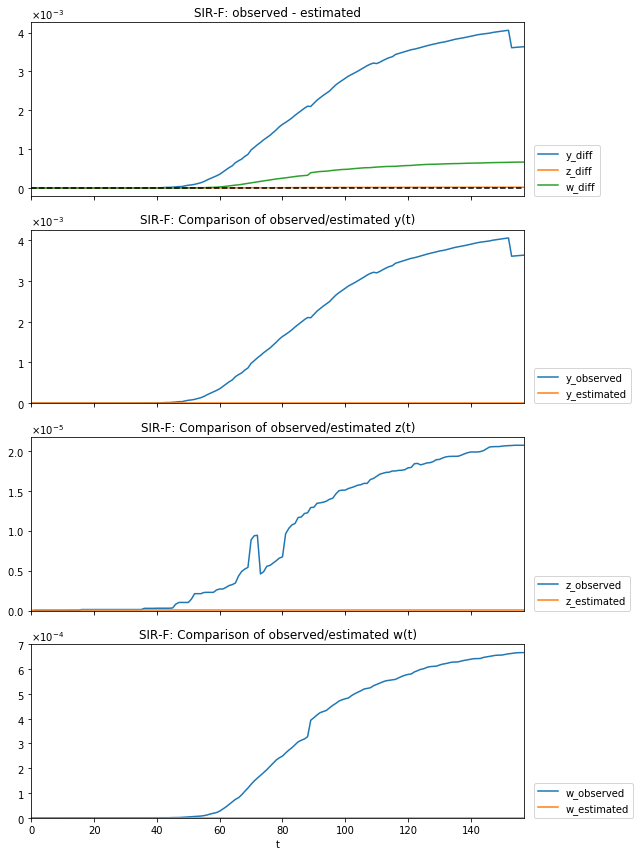

In [62]:
sirf_estimator.compare_graph()

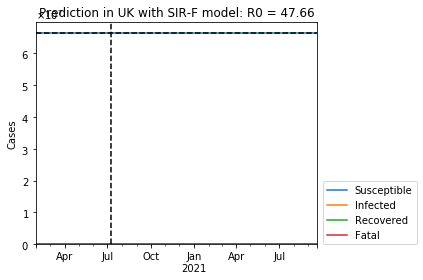

In [63]:
sirf_estimator.predict_graph(step_n=600)

# Scenario in the UK

In [64]:
uk_scenario = Scenario(ncov_df, name="UK", places=[("UK", None)])

/opt/conda/lib/python3.6/site-packages/pandas/core/indexing.py:1418: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike



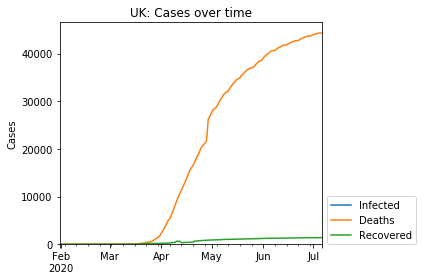

,Date,Confirmed,Infected,Deaths,Recovered
153,2020-07-02,285268,NaN,44080,1373
154,2020-07-03,285787,NaN,44216,1375
155,2020-07-04,286412,NaN,44283,1375
156,2020-07-05,286931,NaN,44305,1375
157,2020-07-06,287290,NaN,44321,1375


In [65]:
uk_scenario.show_record().tail()

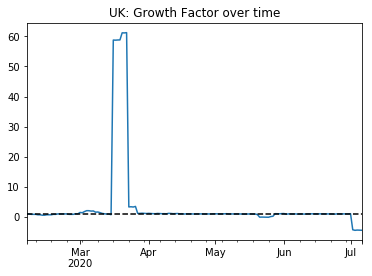

,Date,Group,GF > 1 [straight days],GF < 1 [straight days]
UK,2020-07-06,Crossroad,0,5


In [66]:
uk_scenario.growth_factor()

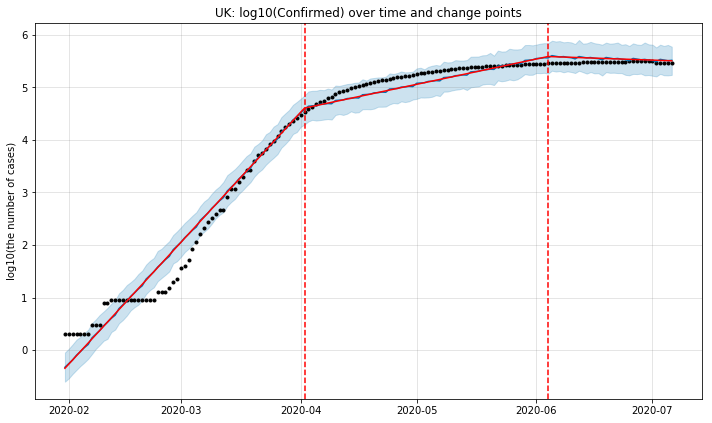

In [67]:
uk_scenario.trend(variables=["Confirmed"])

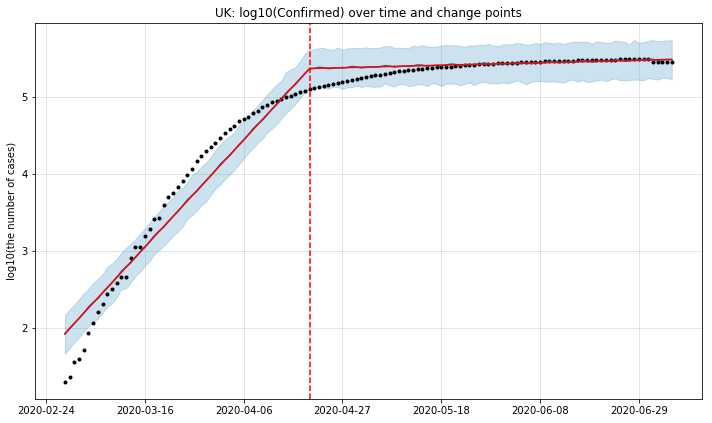

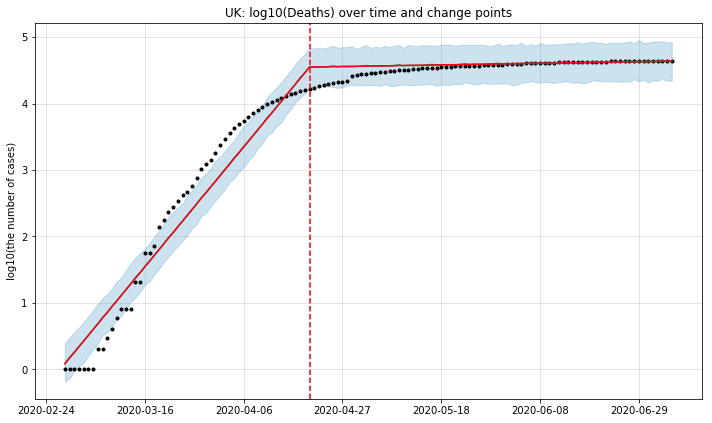

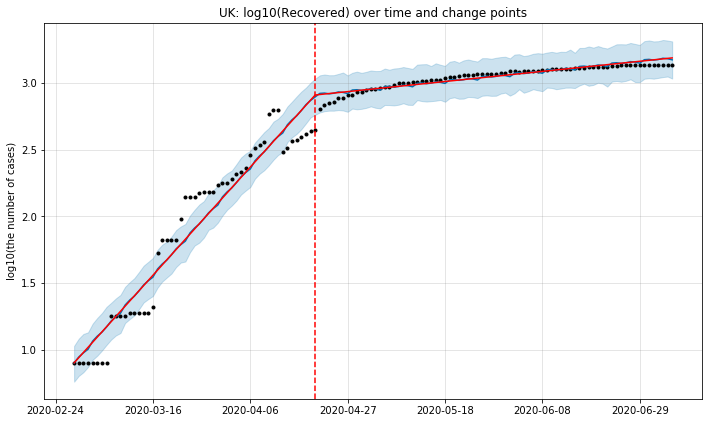

In [68]:
uk_scenario.trend(start_date="28Feb2020")

In [69]:
uk_scenario.set_phase(
    start_dates = ["24Feb2020", "24Mar2020", "19Apr2020"],
    population = pop_dict["UK"]
)

,start_date,end_date,population
1st,24Feb2020,23Mar2020,66440000
2nd,24Mar2020,18Apr2020,66440000
3rd,19Apr2020,-,66440000


## Estimate SIR-F Parameters

In [70]:
uk_scenario.estimate(SIRF)

Hyperparameter estimation of 1st phase.
	Estimator was created.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 25 sec.
		100 trials finished in 0 min 26 sec.
	Estimator will be replaced because estimated w is non-monotonic.
	Estimator was created.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 25 sec.
		100 trials finished in 0 min 26 sec.
		100 trials finished in 0 min 27 sec.
		100 trials finished in 0 min 29 sec.
		100 trials finished in 0 min 30 sec.
	Estimator will be replaced because it is incapable of improvement.
Hyperparameter estimation of 2nd phase.
	Estimator was created.
		100 trials finished in 0 min 22 sec.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 24 sec.
	Estimator w

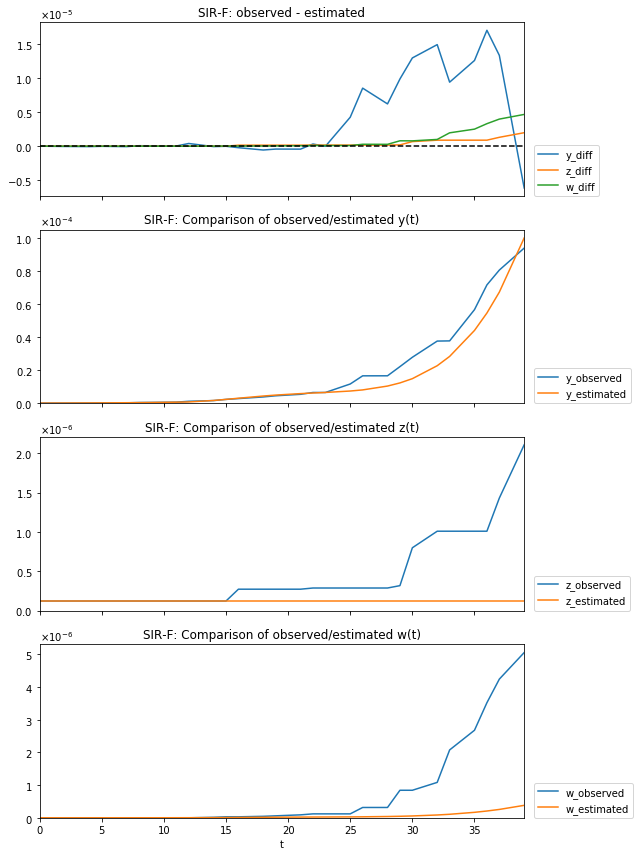

In [71]:
uk_scenario.accuracy_graph(phase_n=1)

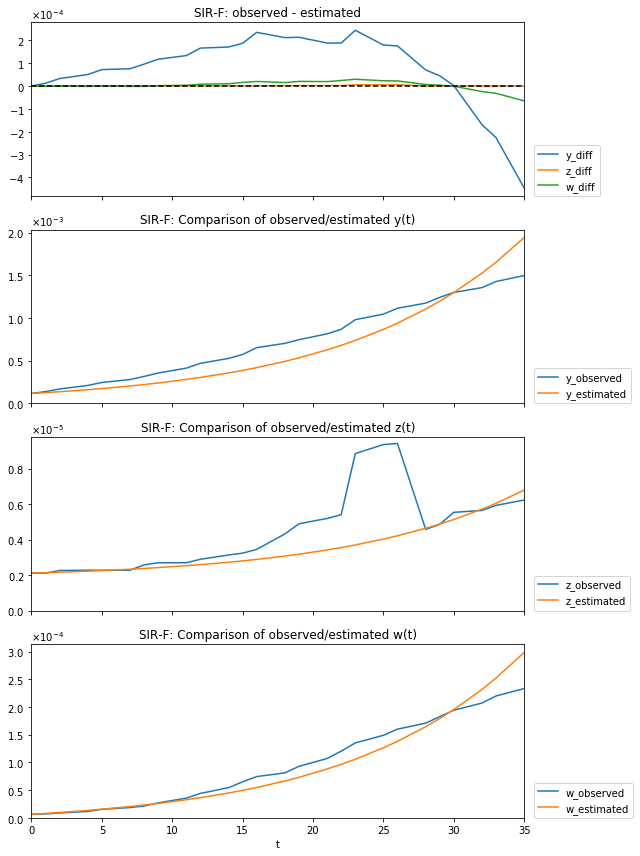

In [72]:
uk_scenario.accuracy_graph(phase_n=2)

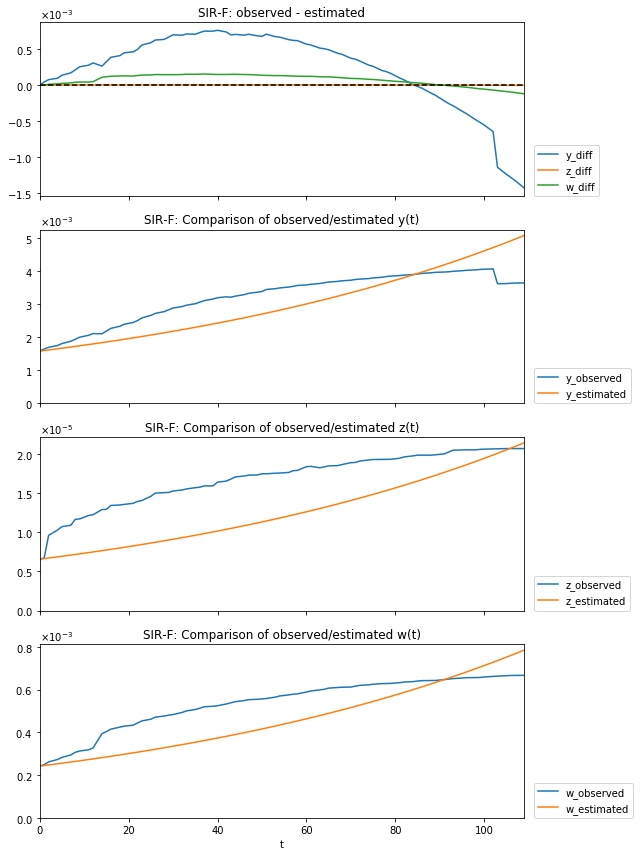

In [73]:
uk_scenario.accuracy_graph(phase_n=3)

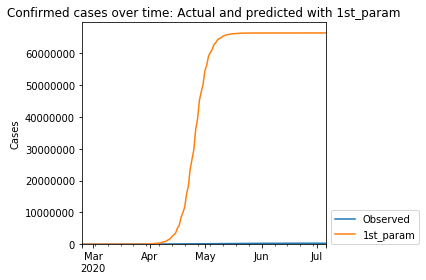

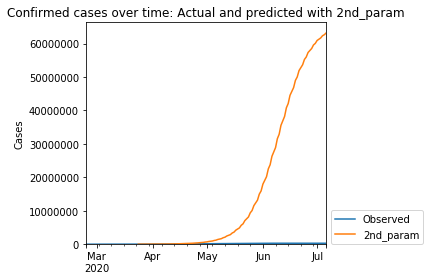

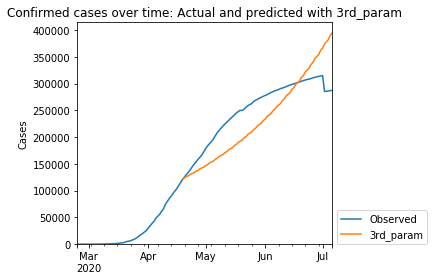

In [74]:
uk_scenario.compare_estimated_numbers()

In [75]:
uk_scenario.param_df

,start_date,end_date,population,tau,theta,kappa,rho,sigma,Rt,score,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day]
1st,24Feb2020,23Mar2020,66440000,1028,0.003276,0.000099,0.192316,0.000000,1936.66,1.208802,0.003,7212,3,0
2nd,24Mar2020,18Apr2020,66440000,1028,0.136309,0.000112,0.094142,0.000207,254.97,0.287583,0.136,6391,7,3445
3rd,19Apr2020,-,66440000,1028,0.108426,0.000319,0.012478,0.000046,30.53,0.294183,0.108,2239,57,15649


In [76]:
uk_scenario.show_parameters()

,start_date,end_date,population,tau,theta,kappa,rho,sigma,Rt,score,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day]
1st,24Feb2020,23Mar2020,66440000,1028,0.003276,0.000099,0.192316,0.000000,1936.66,1.208802,0.003,7212,3,0
2nd,24Mar2020,18Apr2020,66440000,1028,0.136309,0.000112,0.094142,0.000207,254.97,0.287583,0.136,6391,7,3445
3rd,19Apr2020,-,66440000,1028,0.108426,0.000319,0.012478,0.000046,30.53,0.294183,0.108,2239,57,15649


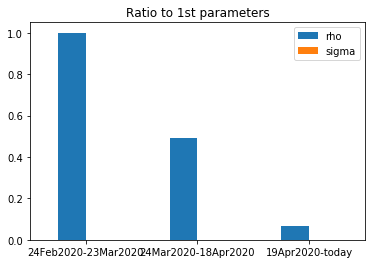

In [77]:
uk_scenario.param_history(["rho", "sigma"])

#### Effect of school closure/lockdown

Acording to first report of COVID-19 Mobility Monitoring project on 23Mar2020, the UK government declared a national lockdown on 23Mar2020 and all peole are asked to remain home. This resulted in average reduction of potential encounters of 81% in retail areas on 05 April.

In [78]:
uk_scenario.phase_dict["3rd"]["start_date"]

'19Apr2020'

### Real factors of $\beta_1$

The parameter in the math model:  
$\rho_1 = \tau \beta_1$  
$\beta_1 = \cfrac{1}{49}[g_s \{g_w + g_i (1-q) \} v (1-m)^2 (1-w_e)^{w_n} e^{-(h_{1}+h_{2})} c \delta]$ [1/min]

Control factors:  
$g_s$: The number of days in <u>a week</u> susceptible persons go out [day]  
$g_w$: The number of days in <u>a week</u> waiting but un-quarantined persons go out [day]  
$g_i$: The number of days in <u>a week</u> currently infected (confirmed) but un-quarantined persons go out [day]  
$q$: Quarantine rate of currently infected (confirmed) patients [-]  
$v$: Probability of virus existance in a droplet [-]  
$m$: Rate of persons wearing masks effectively (depends logistically on supply of masks) [-]  
$w_e$: Virus reduction effect of washing hands [-]  
$w_n$: The number of times people washes their hands before touching their own faces after go out [-]  
$h_1$: Health condition (active rate of cellular immunity factors) of susceptible and contacted persons [-]  
$h_2$: Health condition (active rate of humoral immunity factors) of susceptible and contacted persons [-]  
$c$: The number of contacts between susceptible persons and patients while on the go in a minute (depends on population density) [1/min]  
$\delta$:The product of unknown real factors [-] 

### Value of control factors of $\beta_1$ before/after the national lockdown
A national lockdown will effect on $g_s$ and $c$.

Acccoring the report, we assume average reduction of potential encounters of 82%.

In [79]:
c_before, c_after = 1.0, 0.18

### $g_s$ before the lockdown
We will estimate average number peple go out using @marcoferrante estimation table and population pyramid data.
It is necessary to replace the population pyramid data for Italy because the situation is different from the average data.

In [80]:
uk_out_df = go_out('UK')
uk_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,3,0,0,0.035174
1,3,5,school,4,0,1,0.035658
2,6,10,school,5,0,1,0.060363
3,11,13,school,5,0,1,0.034583
4,14,18,school,6,0,1,0.055262
5,19,25,school/work,3,3,1,0.085452
6,26,35,work,0,6,1,0.136443
7,36,45,work,0,5,1,0.129938
8,46,55,work,0,5,1,0.134289
9,56,65,work,0,5,1,0.119465


In [81]:
gs_before = (uk_out_df[["School", "Office", "Others"]].sum(axis=1) * uk_out_df["Portion"]).sum()
print(f"{round(gs_before, 1)} days in a week susceptible people go out.")

5.7 days in a week susceptible people go out.


### Estimation of $g_s$ after school closure/lockdown
Here, we estimate the $g_s$ after school closure/lockdown with the assumption that only $g_s$ and $c$ was changed.   

Because
$$\cfrac{\rho_{\mathrm{after}}}{gs_{\mathrm{after}}\times c_{\mathrm{after}}} = \cfrac{\rho_{\mathrm{before}}}{gs_{\mathrm{before}}\times c_{\mathrm{before}}}$$

$gs_{\mathrm{after}}$ is

In [82]:
rho_before = uk_scenario.param("1st", "rho")
rho_after = uk_scenario.param("3rd", "rho")
gs_after = rho_after / rho_before / c_after * gs_before * c_before
print(f"{round(gs_after, 1)} days in a week susceptible people go out after lockdown.")

2.1 days in a week susceptible people go out after lockdown.


In [83]:
df = uk_out_df.copy()
df["School"] = 0
df.loc[df["Office"] > 0, "Office"] = 1
sum_so = (df[["School", "Office"]].sum(axis=1) * df["Portion"]).sum()
#df.loc[df["Others"] > 0, "Others"] = round(gs_after - sum_so, 1)
df.loc[df["Others"] > 0, "Others"] = 1
uk_out_after_df = df.copy()
uk_out_after_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,0,0,0,0.035174
1,3,5,school,0,0,1,0.035658
2,6,10,school,0,0,1,0.060363
3,11,13,school,0,0,1,0.034583
4,14,18,school,0,0,1,0.055262
5,19,25,school/work,0,1,1,0.085452
6,26,35,work,0,1,1,0.136443
7,36,45,work,0,1,1,0.129938
8,46,55,work,0,1,1,0.134289
9,56,65,work,0,1,1,0.119465


In [84]:
gs_after = (uk_out_after_df[["School", "Office", "Others"]].sum(axis=1) * uk_out_after_df["Portion"]).sum()
round(gs_after, 1)

1.6

### Predict the Future Outcomes

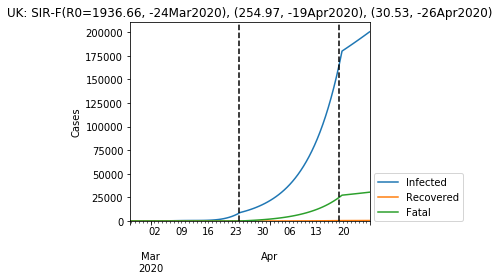

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-04-22 12:56:00,66223187,187764,479,28568,216811
2020-04-23 06:04:00,66220839,189789,488,28883,219160
2020-04-23 23:12:00,66218466,191835,496,29201,221532
2020-04-24 16:20:00,66216067,193903,505,29522,223930
2020-04-25 09:28:00,66213643,195994,514,29847,226355
2020-04-26 02:36:00,66211193,198107,523,30176,228806
2020-04-26 19:44:00,66208716,200242,532,30508,231282


In [85]:
uk_scenario.predict(days=7).tail(7).style.background_gradient(axis=0)

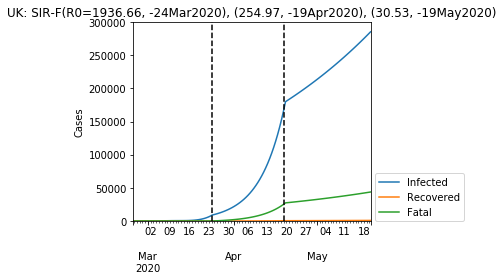

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-05-16 02:20:00,66130795,267429,818,40956,309203
2020-05-16 19:28:00,66127456,270308,830,41403,312541
2020-05-17 12:36:00,66124081,273218,843,41856,315917
2020-05-18 05:44:00,66120670,276159,855,42313,319327
2020-05-18 22:52:00,66117222,279132,868,42776,322776
2020-05-19 16:00:00,66113738,282137,881,43243,326261
2020-05-20 09:08:00,66110216,285173,894,43715,329782


In [86]:
uk_scenario.predict(days=30).tail(7).style.background_gradient(axis=0)

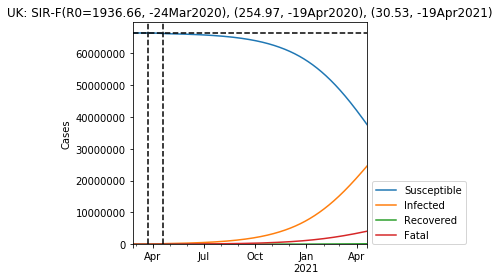

In [87]:
_ = uk_scenario.predict(days=365, min_infected=1)

# Scenario in Italy

In [88]:
ita_scenario = Scenario(ncov_df, name="Italy", places=[("Italy", None)])

/opt/conda/lib/python3.6/site-packages/pandas/core/indexing.py:1418: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike



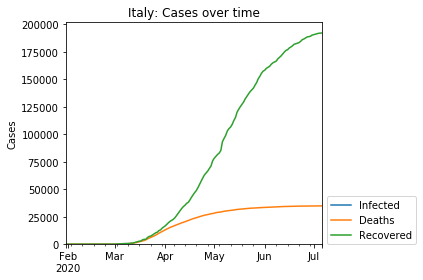

,Date,Confirmed,Infected,Deaths,Recovered
153,2020-07-02,240961,NaN,34818,191083
154,2020-07-03,241184,NaN,34833,191467
155,2020-07-04,241419,NaN,34854,191944
156,2020-07-05,241611,NaN,34861,192108
157,2020-07-06,241819,NaN,34869,192241


In [89]:
ita_scenario.show_record().tail()

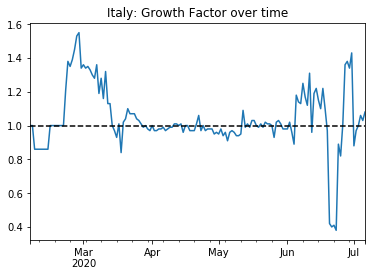

,Date,Group,GF > 1 [straight days],GF < 1 [straight days]
Italy,2020-07-06,Crossroad,3,0


In [90]:
ita_scenario.growth_factor()

## Trend Analysis

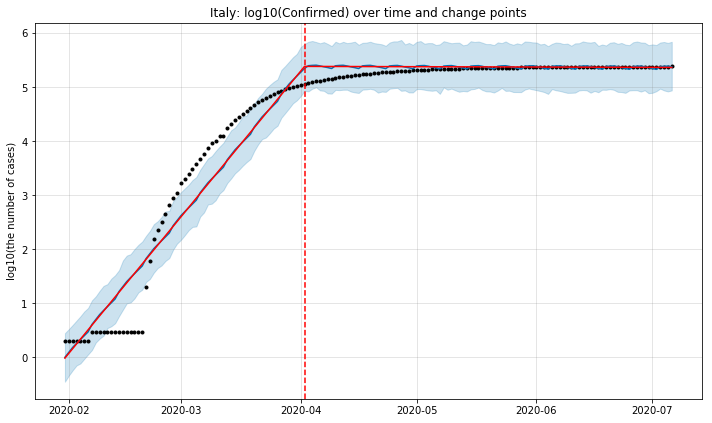

In [91]:
ita_scenario.trend(variables=["Confirmed"])

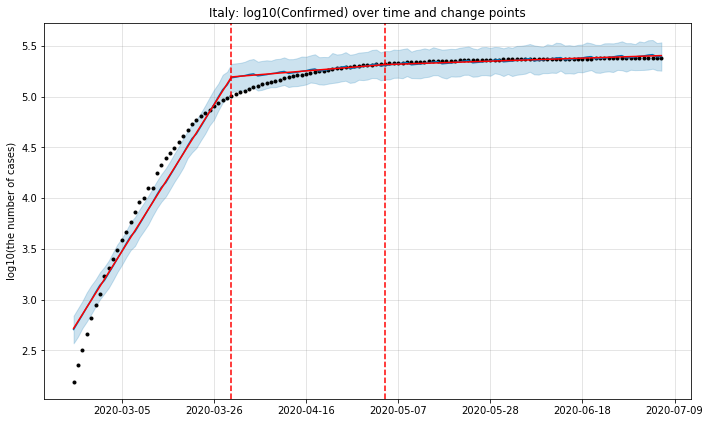

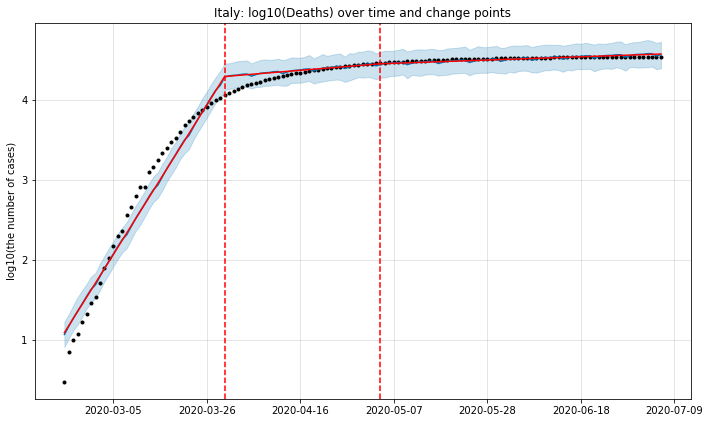

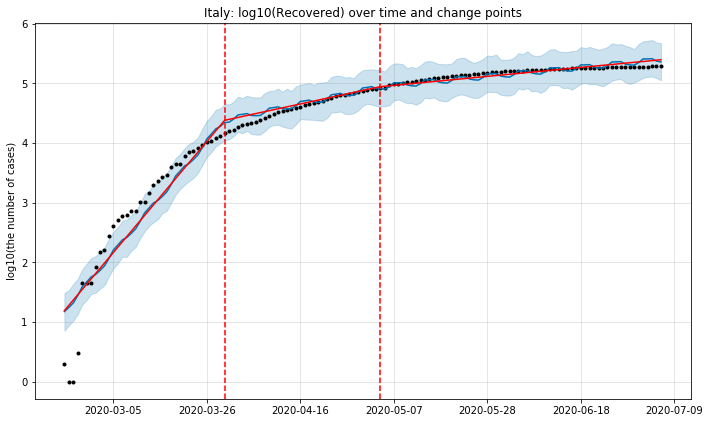

In [92]:
ita_scenario.trend(start_date="23Feb2020", n_changepoints=3)

## Phases in Italy
If the parameters do not change, the trend will not be changed. According to the result of trend analysis, however, the trend of the number of cases was changed at some points. This means that the parameter values were change st some points.

In [93]:
ita_scenario.set_phase(
    start_dates=["29Feb2020", "11Mar2020", "01Apr2020", "19Apr2020"],
    population=pop_dict["Italy"]
)

,start_date,end_date,population
1st,29Feb2020,10Mar2020,60480000
2nd,11Mar2020,31Mar2020,60480000
3rd,01Apr2020,18Apr2020,60480000
4th,19Apr2020,-,60480000


## Estimate SIR-F parameters

In [94]:
ita_scenario.estimate(SIRF)

Hyperparameter estimation of 1st phase.
	Estimator was created.
		100 trials finished in 0 min 25 sec.
		100 trials finished in 0 min 27 sec.
		100 trials finished in 0 min 28 sec.
		100 trials finished in 0 min 27 sec.
		100 trials finished in 0 min 28 sec.
		100 trials finished in 0 min 33 sec.
		100 trials finished in 0 min 32 sec.
	Estimator will be replaced because it is incapable of improvement.
Hyperparameter estimation of 2nd phase.
	Estimator was created.
		100 trials finished in 0 min 22 sec.
		100 trials finished in 0 min 23 sec.
	Successfully estimated.
Hyperparameter estimation of 3rd phase.
	Estimator was created.
		100 trials finished in 0 min 23 sec.
		100 trials finished in 0 min 23 sec.
	Successfully estimated.
Hyperparameter estimation of 4th phase.
	Estimator was created.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 24 sec.
	Successfully estimated.
Total: 5 min 46 sec.


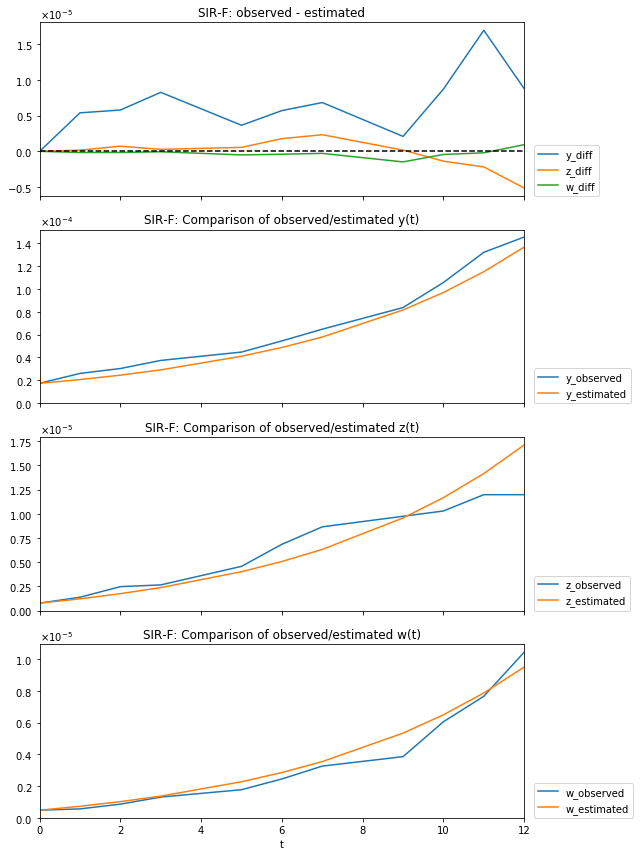

In [95]:
ita_scenario.accuracy_graph(phase_n=1)

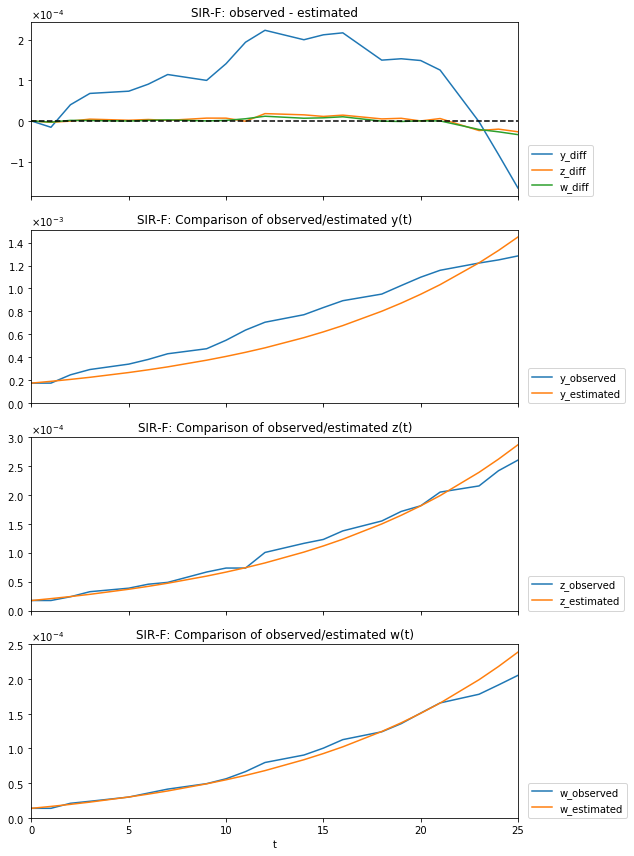

In [96]:
ita_scenario.accuracy_graph(phase_n=2)

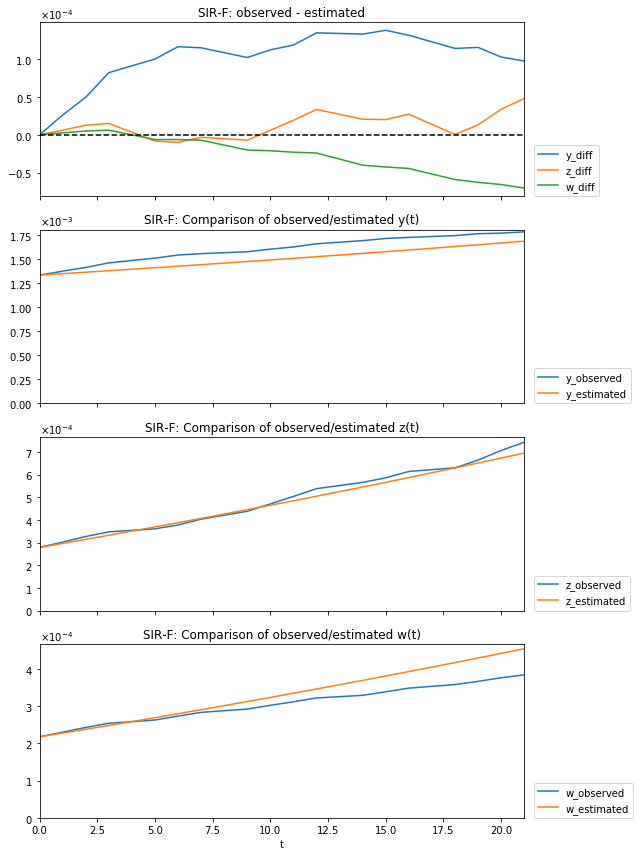

In [97]:
ita_scenario.accuracy_graph(phase_n=3)

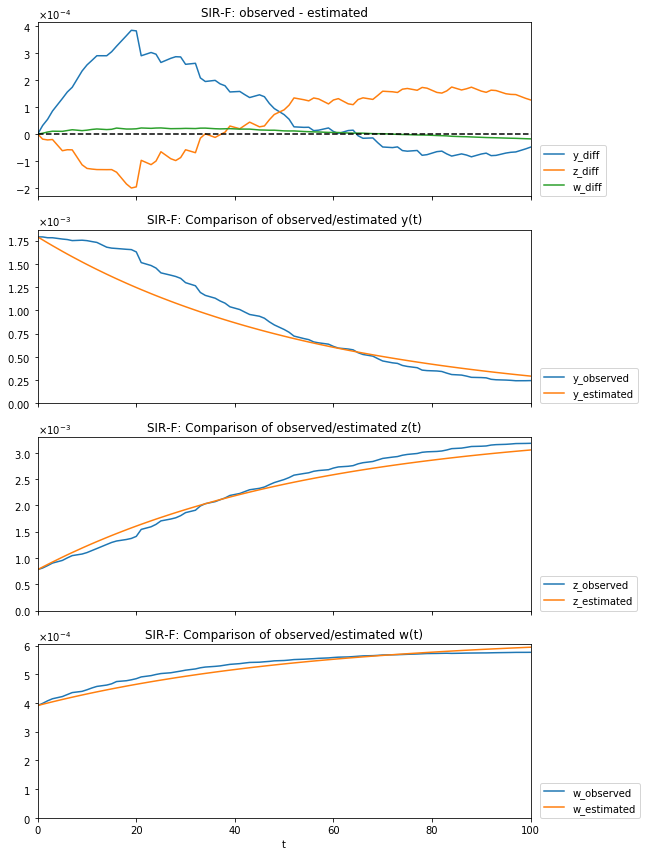

In [98]:
ita_scenario.accuracy_graph(phase_n=4)

In [99]:
ita_scenario.show_parameters()

,start_date,end_date,population,tau,theta,kappa,rho,sigma,Rt,score,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day]
1st,29Feb2020,10Mar2020,60480000,1119,0.061787,0.000122,0.208235,0.023554,8.25,0.189869,0.062,6382,3,32
2nd,11Mar2020,31Mar2020,60480000,1119,0.125006,0.000287,0.117457,0.017872,5.66,0.162353,0.125,2706,6,43
3rd,01Apr2020,18Apr2020,60480000,1119,0.232423,0.000094,0.031969,0.013207,1.84,0.075060,0.232,8291,24,58
4th,19Apr2020,-,60480000,1119,0.180412,0.000322,0.011899,0.027551,0.35,0.113078,0.180,2416,65,28


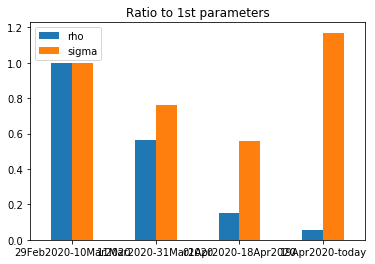

In [100]:
ita_scenario.param_history(["rho", "sigma"])

Non-dimensional effective contact rate  ρ  seems to be reduced, which is a result of the national lockdown introcduced on 13 March 2020. We model this below:

## Effect of lockdown
Effect of school closure/lockdown
Acording to first report of COVID-19 Mobility Monitoring project on 13 March 2020, the government of Italy declared a national lockdown on 09 March 2020 and all peole are asked to remain home. This resulted in average reduction of potential encounters of 19% during week 3 (from 07 March 2020 to 10 March 2020).

### Value of control factors of  β1  before/after the national lockdown

In [101]:
c_before, c_after = 1.0, 0.81

In [102]:
ita_out_df = go_out("Italy")
ita_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,3,0,0,0.023674
1,3,5,school,4,0,1,0.024795
2,6,10,school,5,0,1,0.045552
3,11,13,school,5,0,1,0.028506
4,14,18,school,6,0,1,0.047546
5,19,25,school/work,3,3,1,0.068986
6,26,35,work,0,6,1,0.110560
7,36,45,work,0,5,1,0.137011
8,46,55,work,0,5,1,0.161104
9,56,65,work,0,5,1,0.135972


In [103]:
df = ita_out_df.copy()
gs_before = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_before, 1)} days in a week susceptible people go out.")

5.6 days in a week susceptible people go out.


In [104]:
df = ita_out_df.copy()
df["School"] = 0
df.loc[df["Office"] > 0, "Office"] = 1
sum_so = (df[["School", "Office"]].sum(axis=1) * df["Portion"]).sum()
df.loc[df["Others"] > 0, "Others"] = round(gs_after - sum_so, 1)
ita_out_after_df = df.copy()
ita_out_after_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,0,0,0.0,0.023674
1,3,5,school,0,0,1.0,0.024795
2,6,10,school,0,0,1.0,0.045552
3,11,13,school,0,0,1.0,0.028506
4,14,18,school,0,0,1.0,0.047546
5,19,25,school/work,0,1,1.0,0.068986
6,26,35,work,0,1,1.0,0.110560
7,36,45,work,0,1,1.0,0.137011
8,46,55,work,0,1,1.0,0.161104
9,56,65,work,0,1,1.0,0.135972


In [105]:
df = ita_out_after_df.copy()
gs_after2 = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_after2, 1)} days in a week susceptible people go out after lockdown.")

1.6 days in a week susceptible people go out after lockdown.


### Predict the future with the last parameters

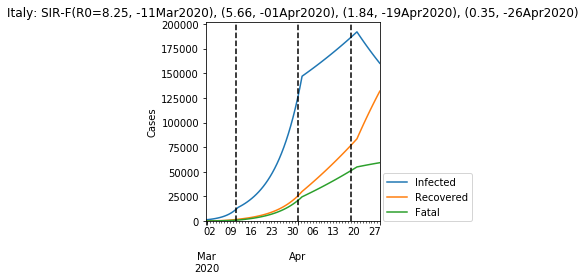

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-04-24 04:09:00,60140843,178603,103848,56703,339154
2020-04-24 22:48:00,60138749,175386,108725,57138,341249
2020-04-25 17:27:00,60136692,172227,113513,57565,343305
2020-04-26 12:06:00,60134673,169125,118215,57984,345324
2020-04-27 06:45:00,60132690,166079,122833,58396,347308
2020-04-28 01:24:00,60130743,163087,127367,58800,349254
2020-04-28 20:03:00,60128831,160150,131820,59197,351167


In [106]:
ita_scenario.predict(days=7).tail(7).style.background_gradient(axis=0)

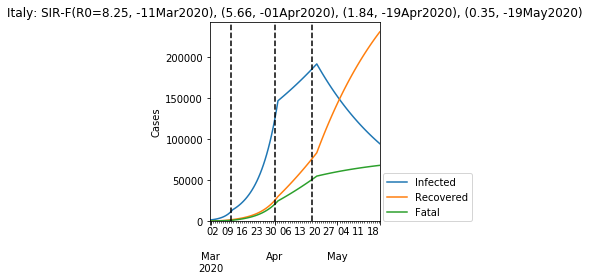

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-05-16 17:00:00,60093229,105422,214759,66588,386769
2020-05-17 11:39:00,60091994,103522,217637,66844,388003
2020-05-18 06:18:00,60090781,101657,220464,67096,389217
2020-05-19 00:57:00,60089590,99825,223239,67343,390407
2020-05-19 19:36:00,60088421,98026,225964,67586,391576
2020-05-20 14:15:00,60087273,96260,228641,67825,392726
2020-05-21 08:54:00,60086145,94525,231269,68059,393853


In [107]:
ita_scenario.predict(days=30).tail(7).style.background_gradient(axis=0)

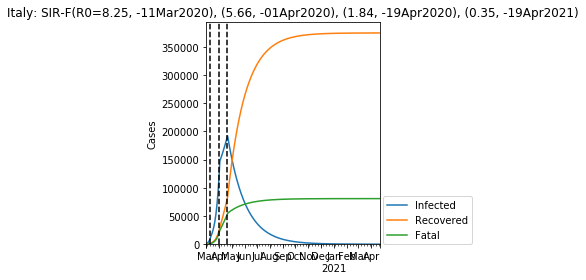

In [108]:
_ = ita_scenario.predict(days=365, min_infected=1)

# India Scenario

In [109]:
ind_scenario = Scenario(ncov_df, name="India", places=[("India", None)])

/opt/conda/lib/python3.6/site-packages/pandas/core/indexing.py:1418: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike



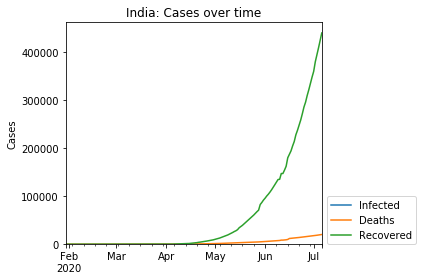

,Date,Confirmed,Infected,Deaths,Recovered
154,2020-07-02,625544,NaN,18213,379892
155,2020-07-03,648315,NaN,18655,394227
156,2020-07-04,673165,NaN,19268,409083
157,2020-07-05,697413,NaN,19693,424433
158,2020-07-06,719664,NaN,20159,439934


In [110]:
ind_scenario.show_record().tail()

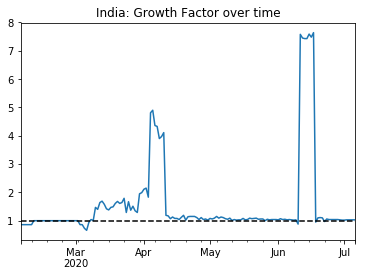

,Date,Group,GF > 1 [straight days],GF < 1 [straight days]
India,2020-07-06,Outbreaking,14,0


In [111]:
ind_scenario.growth_factor()

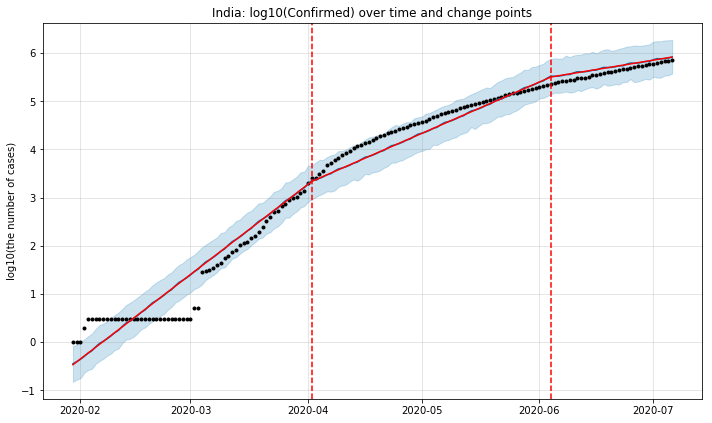

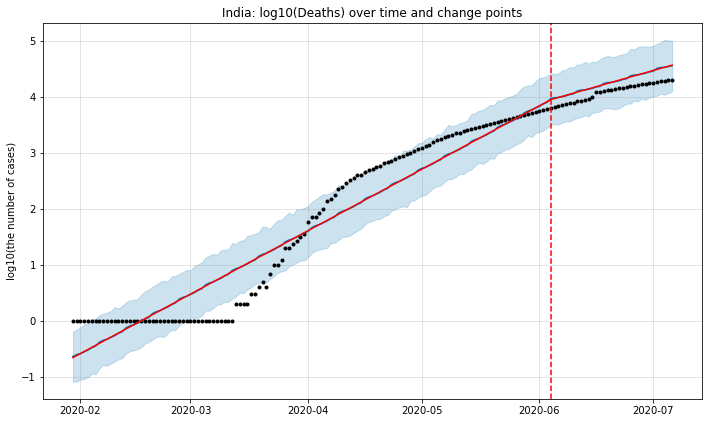

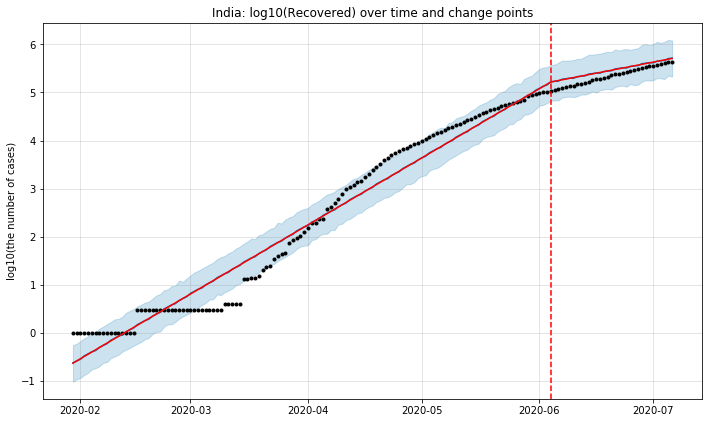

In [112]:
_ = ind_scenario.trend()

## Phases in India
If the parameters do not change, the trend will not be changed. According to the result of trend analysis, however, the trend of the number of cases was changed at some points. This means that the parameter values were change st some points.

In [113]:
ind_scenario.set_phase(
    start_dates=["13Mar2020", "30Apr2020"],
    population=pop_dict["India"]
)

,start_date,end_date,population
1st,13Mar2020,29Apr2020,1339000000
2nd,30Apr2020,-,1339000000


In [114]:
ind_scenario.estimate(SIRF)

Hyperparameter estimation of 1st phase.
	Estimator was created.
		100 trials finished in 0 min 28 sec.
		100 trials finished in 0 min 28 sec.
		100 trials finished in 0 min 29 sec.
		100 trials finished in 0 min 29 sec.
		100 trials finished in 0 min 33 sec.
		100 trials finished in 0 min 37 sec.
	Estimator will be replaced because it is incapable of improvement.
Hyperparameter estimation of 2nd phase.
	Estimator was created.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 24 sec.
		100 trials finished in 0 min 25 sec.
		100 trials finished in 0 min 25 sec.
		100 trials finished in 0 min 25 sec.
	Successfully estimated.
Total: 5 min 13 sec.


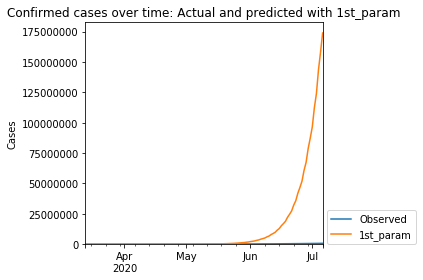

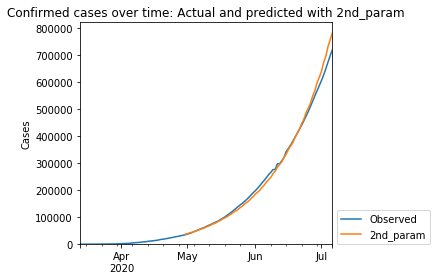

In [115]:
ind_scenario.compare_estimated_numbers(phases=["1st", "2nd"])

In [116]:
ind_scenario.show_parameters()

,start_date,end_date,population,tau,theta,kappa,rho,sigma,Rt,score,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day]
1st,13Mar2020,29Apr2020,1339000000,601,0.027495,0.000757,0.067636,0.010121,6.05,0.660954,0.027,551,6,41
2nd,30Apr2020,-,1339000000,601,0.000830,0.000992,0.037970,0.020637,1.75,0.135923,0.001,420,10,20


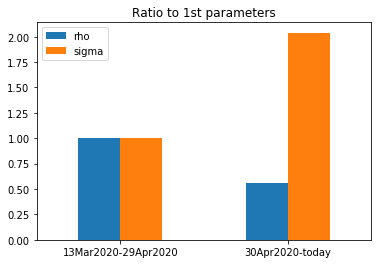

In [117]:
ind_scenario.param_history(["rho", "sigma"])

### Effect of Lockdown

Effect of school closure/lockdown
Acording to first report of COVID-19 Mobility Monitoring project on 13 March 2020, the government of India declared a national lockdown on 24 March 2020 and all peole are asked to remain home. This resulted in average reduction of potential encounters of between 55%-89% during the weeks that followed (per Google Maps data). We therefore use an average rate of a 60% reduction.

In [118]:
c_before, c_after = 1.0, 0.4

In [119]:
ind_out_df = go_out("India")
ind_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,3,0,0,0.051289
1,3,5,school,4,0,1,0.051752
2,6,10,school,5,0,1,0.088830
3,11,13,school,5,0,1,0.055770
4,14,18,school,6,0,1,0.092191
5,19,25,school/work,3,3,1,0.124634
6,26,35,work,0,6,1,0.164456
7,36,45,work,0,5,1,0.135250
8,46,55,work,0,5,1,0.103354
9,56,65,work,0,5,1,0.074217


In [120]:
df = ind_out_df.copy()
gs_before = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_before, 1)} days in a week susceptible people go out.")

6.0 days in a week susceptible people go out.


In [121]:
df = ind_out_df.copy()
df["School"] = 0
df.loc[df["Office"] > 0, "Office"] = 1
sum_so = (df[["School", "Office"]].sum(axis=1) * df["Portion"]).sum()
df.loc[df["Others"] > 0, "Others"] = 0
ita_out_after_df = df.copy()
ita_out_after_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,school,0,0,0,0.051289
1,3,5,school,0,0,0,0.051752
2,6,10,school,0,0,0,0.088830
3,11,13,school,0,0,0,0.055770
4,14,18,school,0,0,0,0.092191
5,19,25,school/work,0,1,0,0.124634
6,26,35,work,0,1,0,0.164456
7,36,45,work,0,1,0,0.135250
8,46,55,work,0,1,0,0.103354
9,56,65,work,0,1,0,0.074217


In [122]:
df = ita_out_after_df.copy()
gs_after2 = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_after2, 1)} days in a week susceptible people go out after lockdown.")

0.6 days in a week susceptible people go out after lockdown.


### Prediction

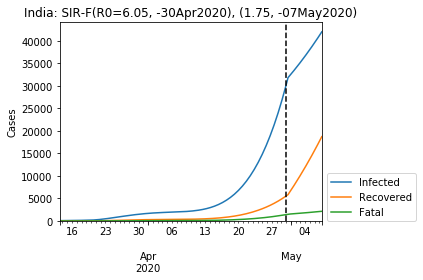

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-05-05 00:07:00,1338946253,38070,13767,1907,53744
2020-05-05 10:08:00,1338944796,38696,14559,1947,55202
2020-05-05 20:09:00,1338943315,39332,15365,1987,56684
2020-05-06 06:10:00,1338941809,39979,16183,2027,58189
2020-05-06 16:11:00,1338940279,40636,17015,2068,59719
2020-05-07 02:12:00,1338938723,41304,17860,2110,61274
2020-05-07 12:13:00,1338937142,41983,18720,2153,62856


In [123]:
ind_scenario.predict(days=7).tail(7).style.background_gradient(axis=0)

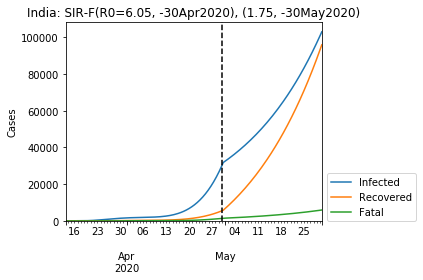

,Susceptible,Infected,Recovered,Fatal,Confirmed
Time,,,,,
2020-05-27 23:02:00,1338817560,93338,83722,5378,182438
2020-05-28 09:03:00,1338813987,94872,85664,5474,186010
2020-05-28 19:04:00,1338810356,96432,87638,5572,189642
2020-05-29 05:05:00,1338806665,98017,89644,5672,193333
2020-05-29 15:06:00,1338802914,99628,91684,5773,197085
2020-05-30 01:07:00,1338799100,101265,93757,5876,200898
2020-05-30 11:08:00,1338795224,102930,95864,5980,204774


In [124]:
ind_scenario.predict(days=30).tail(7).style.background_gradient(axis=0)

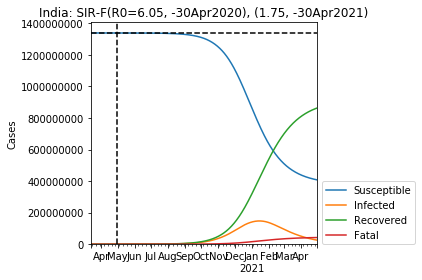

In [125]:
_ = ind_scenario.predict(days=365, min_infected=1)